In [1]:
#data science packages
import pandas as pd
import numpy as np

#visualisation packages
import plotly.io as pio
import plotly.graph_objects as go
import pyreadstat
import matplotlib.pyplot as plt
import matplotlib.colorbar as mcb
import seaborn as sns

#packages needed to plot on a map
from adjustText import adjust_text
import pyogrio
import geopandas as gpd
import pycountry


In [2]:
pio.renderers.default='notebook'
import plotly.offline as pyo
pyo.init_notebook_mode()

In [3]:
df, meta = pyreadstat.read_sav("lrf_wrp_2021_full_data.sav")
df.head()

,WPID_RANDOM,WP5,Country,WGT,Year,GlobalRegion,country.in.both.waves,CountryIncomeLevel2021,CountryIncomeLevel2019,PROJWT_2021,...,REGION_ZAF,REGION2_ZMB,REGION_ZWE,Q2_1_2019A,Q2_1_2019B,Q5A_2019,Q5B_2019,Q5C_2019,Q5D_2019,Q5F_2019
0,174262180.0,1.0,United States,2.132627,2021.0,6.0,1.0,4.0,NaN,562058.627707,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,115327451.0,1.0,United States,0.620385,2021.0,6.0,1.0,4.0,NaN,163503.920074,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,189972125.0,1.0,United States,0.610080,2021.0,6.0,1.0,4.0,NaN,160787.958907,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,173358289.0,1.0,United States,0.490774,2021.0,6.0,1.0,4.0,NaN,129344.456130,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183251831.0,1.0,United States,1.910021,2021.0,6.0,1.0,4.0,NaN,503390.265930,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
df_nepal = df[df.Country=='Nepal']
df_nepal.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2095 entries, 107875 to 280087
Columns: 208 entries, WPID_RANDOM to Q5F_2019
dtypes: float64(207), object(1)
memory usage: 3.3+ MB


In [5]:

#filter out countries with number of data points less than 1200
df = df.groupby('Country').filter(lambda x: x['Country'].count() >= 1200)

df_1=df[df['Q1'].isnull()]

Plot the number of participants from each country

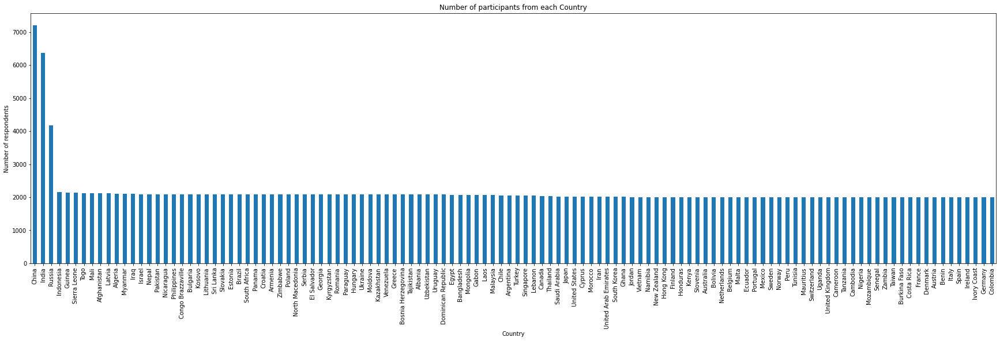

In [6]:
chart = df['Country'].value_counts().plot(kind='bar',
                                    figsize=(30,8),
                                    title="Number of participants from each Country")
chart.set_xlabel("Country")
chart.set_ylabel("Number of respondents")
plt.xticks(rotation = 90)
plt.show()

Most participants are from China, India, and Russia

# Step 1: Simple Exploratory Data Analysis

## Step 1.1. Just some simple bar charts

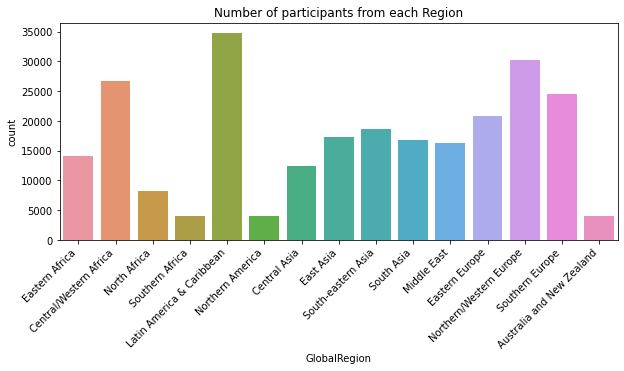

In [7]:
plt.figure(figsize=(10,4))
chart=sns.countplot(x='GlobalRegion', data=df);
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right')
chart.set_xticks([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14])
chart.set_xticklabels(['Eastern Africa','Central/Western Africa','North Africa','Southern Africa','Latin America & Caribbean','Northern America','Central Asia','East Asia','South-eastern Asia','South Asia','Middle East','Eastern Europe','Northern/Western Europe','Southern Europe','Australia and New Zealand'])
chart.set_title('Number of participants from each Region')
plt.show()

Global region wise, most of the participants are from Latin America & Caribbean, Nothern/western Europe, and Central Western Africa.

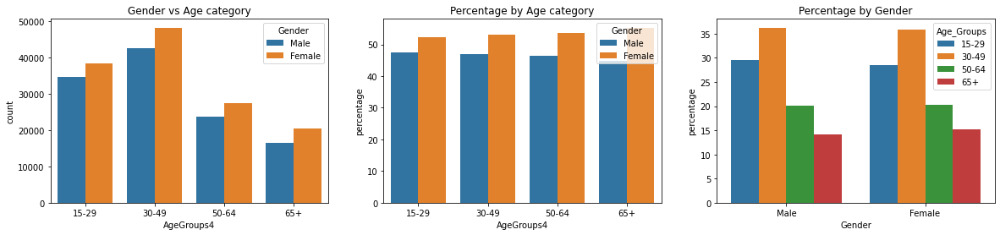

In [8]:
# Define the mapping of values to labels
age_labels = {1: '15-29', 2: '30-49', 3: '50-64', 4: '65+'}
gender_labels = {1: 'Male', 2: 'Female'}

# Create the plot
fig, axes = plt.subplots(1,3,figsize=(20,4))
#chart = sns.countplot(x='AgeGroups4', data=df, hue='Gender', hue_order=[1, 2], width=0.4, ax=axes[0])
chart = sns.countplot(x='AgeGroups4', data=df, hue='Gender', hue_order=[1, 2], ax=axes[0])
sns.move_legend(chart, "upper right", title='Gender')
chart.set_xticks([0, 1, 2, 3])
chart.set_title("Gender vs Age category")

# Rename the x-axis tick labels
new_labels = [age_labels[val] for val in range(1, 5)]
chart.set_xticklabels(new_labels)

# Rename the legend labels
handles, labels = axes[0].get_legend_handles_labels()
new_labels = [gender_labels[int(label)] for label in labels]
axes[0].legend(handles, new_labels, title='Gender')


grouped = df.groupby(['AgeGroups4', 'Gender']).size().reset_index(name='count')
totals = grouped.groupby('AgeGroups4')['count'].sum().reset_index(name='total')
grouped = pd.merge(grouped, totals, on='AgeGroups4')
grouped['percentage'] = grouped['count'] / grouped['total'] * 100

# Create the plot
#chart = sns.barplot(x='AgeGroups4', y='percentage', hue='Gender', data=grouped, hue_order=[1, 2], width=0.4,ax=axes[1])
chart = sns.barplot(x='AgeGroups4', y='percentage', hue='Gender', data=grouped, hue_order=[1, 2], ax=axes[1])

sns.move_legend(chart, "upper right", title='Gender')
chart.set_xticklabels([age_labels[val] for val in range(1, 5)])
chart.set_title("Percentage by Age category")

# Rename the legend labels
handles, labels = axes[1].get_legend_handles_labels()
new_labels = [gender_labels[int(label)] for label in labels]
axes[1].legend(handles, new_labels, title='Gender')

grouped_1 = df.groupby(['Gender', 'AgeGroups4']).size().reset_index(name='count')
totals = grouped_1.groupby('Gender')['count'].sum().reset_index(name='total')
grouped_1 = pd.merge(grouped_1, totals, on='Gender')
grouped_1['percentage'] = grouped_1['count'] / grouped_1['total'] * 100

# Create the plot
#chart = sns.barplot(x='Gender', y='percentage', hue='AgeGroups4', data=grouped_1, hue_order=[1, 2,3,4], width=0.4,ax=axes[2])
chart = sns.barplot(x='Gender', y='percentage', hue='AgeGroups4', data=grouped_1, hue_order=[1, 2,3,4], ax=axes[2])

sns.move_legend(chart, "upper right", title='AgeGroups4')

chart.set_xticklabels([gender_labels[val] for val in range(1, 3)])
chart.set_title("Percentage by Gender")

# Rename the legend labels
handles, labels = axes[2].get_legend_handles_labels()
new_labels = [age_labels[int(label)] for label in labels]
axes[2].legend(handles, new_labels, title='Age_Groups')

# Show the plot
plt.show()


It is clear by from the counts graphs, the female participants are higher in all the age categories. The highest percentage of females by age category is from 'above 65+' age category. And the highest percentage of males from age group 15-29.

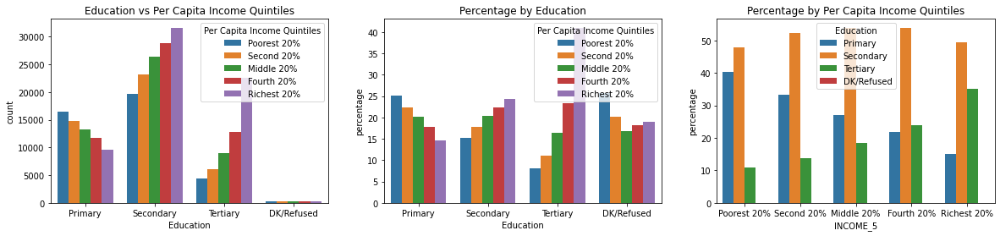

In [9]:
# Define the mapping of values to labels
edu_labels = {1: 'Primary', 2: 'Secondary', 3: 'Tertiary', 4: 'DK/Refused'}
income_labels = {1: 'Poorest 20%', 2: 'Second 20%', 3: 'Middle 20%', 4: 'Fourth 20%', 5: 'Richest 20%'}

# Create the plot
fig, axes = plt.subplots(1,3,figsize=(20,4))
#chart = sns.countplot(x='Education', data=df, hue='INCOME_5', hue_order=[1, 2,3,4,5], width=0.4, ax=axes[0])
chart = sns.countplot(x='Education', data=df, hue='INCOME_5', hue_order=[1, 2,3,4,5], ax=axes[0])

sns.move_legend(chart, "upper right", title='Per Capita Income Quintiles')
chart.set_xticks([0, 1, 2, 3])
chart.set_title("Education vs Per Capita Income Quintiles")

# Rename the x-axis tick labels
new_labels = [edu_labels[val] for val in range(1, 5)]
chart.set_xticklabels(new_labels)

# Rename the legend labels
handles, labels = axes[0].get_legend_handles_labels()
new_labels = [income_labels[int(label)] for label in labels]
axes[0].legend(handles, new_labels, title='Per Capita Income Quintiles')


grouped = df.groupby(['Education', 'INCOME_5']).size().reset_index(name='count')
totals = grouped.groupby('Education')['count'].sum().reset_index(name='total')
grouped = pd.merge(grouped, totals, on='Education')
grouped['percentage'] = grouped['count'] / grouped['total'] * 100

# Create the plot
chart = sns.barplot(x='Education', y='percentage', hue='INCOME_5', data=grouped, hue_order=[1, 2,3,4,5], ax=axes[1])
sns.move_legend(chart, "upper right", title='Per Capita Income Quintiles')
chart.set_xticklabels([edu_labels[val] for val in range(1, 5)])
chart.set_title("Percentage by Education")

# Rename the legend labels
handles, labels = axes[1].get_legend_handles_labels()
new_labels = [income_labels[int(label)] for label in labels]
axes[1].legend(handles, new_labels, title='Per Capita Income Quintiles')

grouped_1 = df.groupby(['INCOME_5', 'Education']).size().reset_index(name='count')
totals = grouped_1.groupby('INCOME_5')['count'].sum().reset_index(name='total')
grouped_1 = pd.merge(grouped_1, totals, on='INCOME_5')
grouped_1['percentage'] = grouped_1['count'] / grouped_1['total'] * 100

# Create the plot
chart = sns.barplot(x='INCOME_5', y='percentage', hue='Education', data=grouped_1, hue_order=[1, 2,3,4], ax=axes[2])
sns.move_legend(chart, "upper right", title='Education')
chart.set_xticklabels([income_labels[val] for val in range(1, 6)])
chart.set_title("Percentage by Per Capita Income Quintiles")

# Rename the legend labels
handles, labels = axes[2].get_legend_handles_labels()
new_labels = [edu_labels[int(label)] for label in labels]
axes[2].legend(handles, new_labels, title='Education')

# Show the plot
plt.show()

Most percentage of people with secondary and thirtiary education are from richest 20%. However when the percentages are calsulated by percapita income levels the highest percentages for all income categories are from secondary eduvated people which suggest most of the students stop thir esducation from secondary level without any university education.

Question 1 : Feel More, Less or About as Safe Compared With Five Years Ago

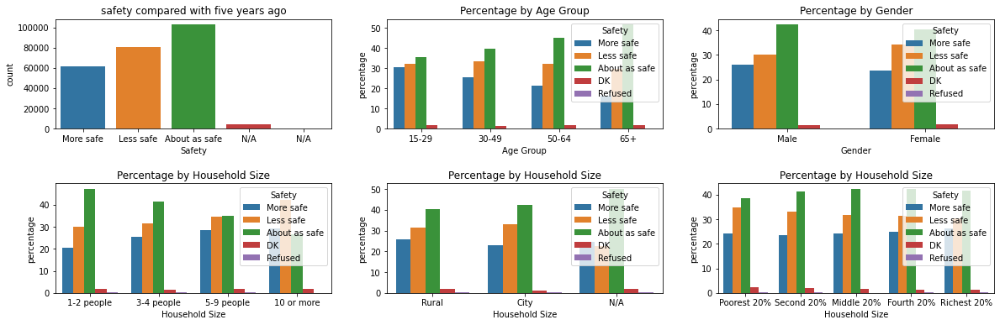

In [10]:
# Define the mapping of values to labels
safety_labels = {1: 'More safe', 2: 'Less safe', 3: 'About as safe', 98: 'DK', 99: 'Refused'}
age_labels = {1: '15-29', 2: '30-49', 3: '50-64', 4: '65+'}
gender_labels = {1: 'Male', 2: 'Female'}
housesize_labels = {1: '1-2 people', 2: '3-4 people', 3: '5-9 people', 4: '10 or more'}
urban_labels = {1: 'Rural', 2: 'City', 9: 'DK/Refused'}
income_labels = {1: 'Poorest 20%', 2: 'Second 20%', 3: 'Middle 20%', 4: 'Fourth 20%', 5: 'Richest 20%'}

# Create the plot
fig, axes = plt.subplots(2,3,figsize=(20,6))

chart=sns.countplot(x='Q1', data=df,  ax=axes[0,0]);
chart.set_xticks([0,1,2,3,4])
chart.set_title("safety compared with five years ago")
# Set the x-axis tick labels
new_labels = [safety_labels[val] if val in safety_labels else "N/A" for val in range(1, 6)]
chart.set_xticklabels(new_labels)
chart.set_xlabel('Safety')


grouped = df.groupby(['AgeGroups4', 'Q1']).size().reset_index(name='count')
totals = grouped.groupby('AgeGroups4')['count'].sum().reset_index(name='total')
grouped = pd.merge(grouped, totals, on='AgeGroups4')
grouped['percentage'] = grouped['count'] / grouped['total'] * 100
# Create the plot
chart = sns.barplot(x='AgeGroups4', y='percentage', hue='Q1', data=grouped, hue_order=[1, 2,3,98,99], ax=axes[0,1])
sns.move_legend(chart, "upper right", title='Safety')
chart.set_xticklabels([age_labels[val] for val in range(1, 5)])
chart.set_title("Percentage by Age Group")
chart.set_xlabel('Age Group')
# Rename the legend labels
handles, labels = axes[0,1].get_legend_handles_labels()
new_labels = [safety_labels[int(label)] for label in labels]
axes[0,1].legend(handles, new_labels, title='Safety')

grouped = df.groupby(['Gender', 'Q1']).size().reset_index(name='count')
totals = grouped.groupby('Gender')['count'].sum().reset_index(name='total')
grouped = pd.merge(grouped, totals, on='Gender')
grouped['percentage'] = grouped['count'] / grouped['total'] * 100
# Create the plot
chart = sns.barplot(x='Gender', y='percentage', hue='Q1', data=grouped, hue_order=[1, 2,3,98,99], ax=axes[0,2])
sns.move_legend(chart, "upper right", title='Safety')
chart.set_xticklabels([gender_labels[val] for val in range(1, 3)])
chart.set_title("Percentage by Gender")
chart.set_xlabel('Gender')
# Rename the legend labels
handles, labels = axes[0,2].get_legend_handles_labels()
new_labels = [safety_labels[int(label)] for label in labels]
axes[0,2].legend(handles, new_labels, title='Safety')

grouped = df.groupby(['HouseholdSize', 'Q1']).size().reset_index(name='count')
totals = grouped.groupby('HouseholdSize')['count'].sum().reset_index(name='total')
grouped = pd.merge(grouped, totals, on='HouseholdSize')
grouped['percentage'] = grouped['count'] / grouped['total'] * 100
# Create the plot
chart = sns.barplot(x='HouseholdSize', y='percentage', hue='Q1', data=grouped, hue_order=[1, 2,3,98,99],ax=axes[1,0])
sns.move_legend(chart, "upper right", title='Safety')
chart.set_xticklabels([housesize_labels[val] for val in range(1, 5)])
chart.set_title("Percentage by Household Size")
chart.set_xlabel('Household Size')
# Rename the legend labels
handles, labels = axes[1,0].get_legend_handles_labels()
new_labels = [safety_labels[int(label)] for label in labels]
axes[1,0].legend(handles, new_labels, title='Safety')

grouped = df.groupby(['Urbanicity', 'Q1']).size().reset_index(name='count')
totals = grouped.groupby('Urbanicity')['count'].sum().reset_index(name='total')
grouped = pd.merge(grouped, totals, on='Urbanicity')
grouped['percentage'] = grouped['count'] / grouped['total'] * 100
# Create the plot
chart = sns.barplot(x='Urbanicity', y='percentage', hue='Q1', data=grouped, hue_order=[1, 2,3,98,99], ax=axes[1,1])
sns.move_legend(chart, "upper right", title='Safety')
chart.set_xticklabels([urban_labels[val] if val in urban_labels else "N/A" for val in range(1, 4)])
chart.set_title("Percentage by Household Size")
chart.set_xlabel('Household Size')
# Rename the legend labels
handles, labels = axes[1,1].get_legend_handles_labels()
new_labels = [safety_labels[int(label)] for label in labels]
axes[1,1].legend(handles, new_labels, title='Safety')

grouped = df.groupby(['INCOME_5', 'Q1']).size().reset_index(name='count')
totals = grouped.groupby('INCOME_5')['count'].sum().reset_index(name='total')
grouped = pd.merge(grouped, totals, on='INCOME_5')
grouped['percentage'] = grouped['count'] / grouped['total'] * 100
# Create the plot
chart = sns.barplot(x='INCOME_5', y='percentage', hue='Q1', data=grouped, hue_order=[1, 2,3,98,99],ax=axes[1,2])
sns.move_legend(chart, "upper right", title='Safety')
chart.set_xticklabels([income_labels[val] for val in range(1, 6)])
chart.set_title("Percentage by Household Size")
chart.set_xlabel('Household Size')
# Rename the legend labels
handles, labels = axes[1,2].get_legend_handles_labels()
new_labels = [safety_labels[int(label)] for label in labels]
axes[1,2].legend(handles, new_labels, title='Safety')

# Adjust horizontal space between subplots
fig.subplots_adjust(hspace=0.5)

# Show the plot
plt.show()



Based on the safety propotion by Gender, highest percentage of males confims that they are safe (more safe and about as safe), while highest percentage of females feels that they are unsafe. Based on safety propotion by Age Group, highest percentsge of older paerticipants (over 65 years of age) feels that they are about as safe.  The percentage of peoples with more that 10 or more memebers feels that they are unsafe. The higher percentage of people in rural area feel that they are more safe that city people. 

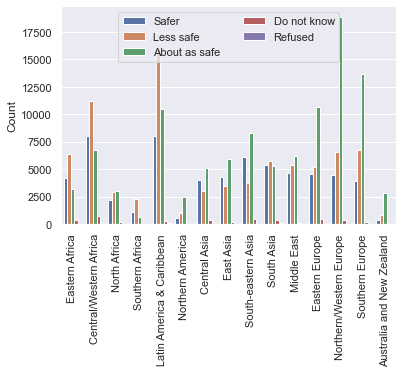

In [11]:
sns.set(font_scale=1)
#fig, axes = plt.subplots(figsize=(12,4))

#fig.suptitle('Feel More, Less or About as Safe Compared With Five Years Ago')
g1=sns.countplot(x='GlobalRegion', data=df, hue='Q1');
g1.legend(loc='upper center',ncol=2, labels=['Safer','Less safe','About as safe','Do not know','Refused'])
#sns.move_legend(g1, "upper right", title='Safety', labels=['More safe','Less safe','About as safe','DK','Refused'])
g1.set_xticklabels(g1.get_xticklabels(), rotation = 90)
g1.set_xticks([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14])
g1.set_xticklabels(['Eastern Africa','Central/Western Africa','North Africa','Southern Africa','Latin America & Caribbean','Northern America','Central Asia','East Asia','South-eastern Asia','South Asia','Middle East','Eastern Europe','Northern/Western Europe','Southern Europe','Australia and New Zealand'])
g1.set_xlabel('')
g1.set_ylabel('Count')


plt.savefig('Figures/safety_region.pdf',bbox_inches="tight")
plt.show()

All the African regions except North Africa, Latin & Carribian region feels that they are less safe while North American, Asia, Middle east Europe, and Acutralia/NZ areas feels that they are safe.

Here, the highest propotion of pasific (NZ and Ausi) participants followed by Europeans show that they are feeling about as safe compared to last five years. However when considering north and south americans as one, highest propositon of them feels that they are less safe followed by Africans. As compared with above count graph, the feeling of safety from north and south americans are completely opposite. So below graphs comapre the propotions seperately

Q2_1 - Riska to safety

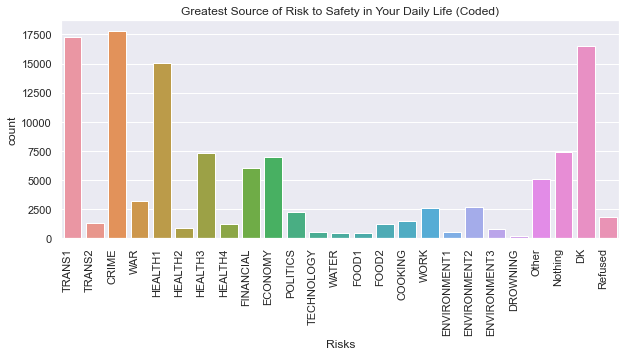

In [12]:
plt.figure(figsize=(10,4))
chart=sns.countplot(x='Q2_1', data=df);
chart.set_xticklabels(chart.get_xticklabels(), rotation=90, horizontalalignment='right')
chart.set_xlabel('Risks')
chart.set_xticks([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24])
chart.set_xticklabels(['TRANS1','TRANS2','CRIME','WAR','HEALTH1','HEALTH2','HEALTH3','HEALTH4','FINANCIAL','ECONOMY','POLITICS','TECHNOLOGY','WATER','FOOD1','FOOD2','COOKING','WORK','ENVIRONMENT1','ENVIRONMENT2','ENVIRONMENT3','DROWNING','Other','Nothing','DK','Refused'])
chart.set_title('Greatest Source of Risk to Safety in Your Daily Life (Coded)')
plt.savefig('Figures/risks.pdf')
plt.show()


People found transportation, crime/ violance, and personal health related issues are the most risky sources for daily lives.

when the age increases above 60 years, People start to worry about personal health and cooking and other household accidents.  Technology as a risk to safety affects to all peoplr irrespective of their age.

When comparing the risks regin wise, we can see that Asians risks health issues and Pacifics and Europeans are more concerning over transpotation related isuues. Americans and Africans risk crime related issues. 

## Step 1.2: Spider chart of each region perception to risks and experience to disasters

In [13]:
df = df.astype({"GlobalRegion": int})
Africa = ['Eastern Africa','Central/Western Africa','North Africa','Southern Africa']
AmericaANZ = ['Latin America & Caribbean','Northern America','Australia and New Zealand']
Asia = ['Central Asia','East Asia','South-eastern Asia','South Asia','Middle East']
Europe = ['Eastern Europe','Northern/Western Europe','Southern Europe']

In [14]:
#Make Africa Scatterpolar chart
Region = Africa
Categories = ['Food','Water','Crime','Serious Weather','Traffic','Mental health','Work accident']
Col = ['Q4A','Q4B','Q4C','Q4D','Q4E','Q4F','Q4G']
layout = go.Layout(
    autosize=True,  # Enable autosizing
    width=500,  # Adjust the width of the plot
    height=400,  # Adjust the height of the plot
    margin=dict(l=5, r=0, t=15, b=2)  # Set the left, right, top, and bottom margins to zero
)

fig = go.Figure( layout=layout)

for m in range(1,4):
    dfm = df.loc[df.GlobalRegion==m,Col]
    dfm.dropna(inplace=True)
    dfm = dfm[dfm<4]
    dfm.replace({3: 0, 2: 0.5}, inplace=True)
    value= dfm.mean()

    fig.add_trace(go.Scatterpolar(
        theta=Categories,
        r=value,
        name=Region[m],
        fill='toself'
        
    ))

min_value = 0
max_value = 0.8

fig.update_layout(
    polar=dict(
        radialaxis=dict(
            range=[min_value, max_value]  # Set the minimum and maximum values for the r-axis
        )
    ),
    legend=dict(yanchor="top", y=-0.15, xanchor="left", x=0.4),
    legend_orientation="v"
)

# pio.write_image(fig,'./Figures/Risks_perception_Africa.pdf')
#fig.write_image('./Figures/Risks_perception_Africa.pdf') 
fig.show()

In [15]:
#Make AmericaANZ Scatterpolar chart
Region = AmericaANZ
Categories = ['Food','Water','Crime','Serious Weather','Traffic','Mental health','Work accident']
Col = ['Q4A','Q4B','Q4C','Q4D','Q4E','Q4F','Q4G']
layout = go.Layout(
    autosize=True,  # Enable autosizing
    width=500,  # Adjust the width of the plot
    height=400,  # Adjust the height of the plot
    margin=dict(l=5, r=0, t=15, b=2)  # Set the left, right, top, and bottom margins to zero
)
fig = go.Figure(layout=layout)
count0=0
for m in [5,6,15]:
    dfm = df.loc[df.GlobalRegion==m,Col]
    dfm.dropna(inplace=True)
    dfm = dfm[dfm<4]
    dfm.replace({3: 0, 2: 0.5}, inplace=True)
    value= dfm.mean()

    fig.add_trace(go.Scatterpolar(
        theta=Categories,
        r=value,
        name=Region[count0],
        fill='toself'
        
    ))
    count0+=1

min_value = 0
max_value = 0.8

fig.update_layout(
    polar=dict(
        radialaxis=dict(
            range=[min_value, max_value]  # Set the minimum and maximum values for the r-axis
        )
    ),
    legend=dict(yanchor="top", y=-0.15, xanchor="left", x=0.4),
    legend_orientation="v"
)

pio.write_image(fig,'./Figures/Risks_perception_AmericaANZ.pdf') 
fig.show()

In [16]:
#Make Asia Scatterpolar chart
Region = Asia
Categories = ['Food','Water','Crime','Serious Weather','Traffic','Mental health','Work accident']
Col = ['Q4A','Q4B','Q4C','Q4D','Q4E','Q4F','Q4G']
layout = go.Layout(
    autosize=True,  # Enable autosizing
    width=500,  # Adjust the width of the plot
    height=400,  # Adjust the height of the plot
    margin=dict(l=5, r=0, t=15, b=2)  # Set the left, right, top, and bottom margins to zero
)
fig = go.Figure(layout=layout)
count0=0
for m in range(7,12):
    dfm = df.loc[df.GlobalRegion==m,Col]
    dfm.dropna(inplace=True)
    dfm = dfm[dfm<4]
    dfm.replace({3: 0, 2: 0.5}, inplace=True)
    value= dfm.mean()

    fig.add_trace(go.Scatterpolar(
        theta=Categories,
        r=value,
        name=Region[count0],
        fill='toself'
        
    ))
    count0+=1

min_value = 0
max_value = 0.8

fig.update_layout(
    polar=dict(
        radialaxis=dict(
            range=[min_value, max_value]  # Set the minimum and maximum values for the r-axis
        )
    ),
    legend=dict(yanchor="top", y=-0.15, xanchor="left", x=0.4),
    legend_orientation="v"
)

pio.write_image(fig,'./Figures/Risks_perception_Asia.pdf') 
fig.show()

In [17]:
#Make Europe Scatterpolar chart
Region = Europe
Categories = ['Food','Water','Crime','Serious Weather','Traffic','Mental health','Work accident']
Col = ['Q4A','Q4B','Q4C','Q4D','Q4E','Q4F','Q4G']
layout = go.Layout(
    autosize=True,  # Enable autosizing
    width=500,  # Adjust the width of the plot
    height=400,  # Adjust the height of the plot
    margin=dict(l=5, r=0, t=15, b=2)  # Set the left, right, top, and bottom margins to zero
)
fig = go.Figure(layout=layout)
count0=0
for m in [12,13,14]:
    dfm = df.loc[df.GlobalRegion==m,Col]
    dfm.dropna(inplace=True)
    dfm = dfm[dfm<4]
    dfm.replace({3: 0, 2: 0.5}, inplace=True)
    value= dfm.mean()

    fig.add_trace(go.Scatterpolar(
        theta=Categories,
        r=value,
        name=Region[count0],
        fill='toself'
        
    ))
    count0+=1

min_value = 0
max_value = 0.8

fig.update_layout(
    polar=dict(
        radialaxis=dict(
            range=[min_value, max_value]  # Set the minimum and maximum values for the r-axis
        )
    ),
    legend=dict(yanchor="top", y=-0.15, xanchor="left", x=0.4),
    legend_orientation="v"
)

pio.write_image(fig,'./Figures/Risks_perception_Europe.pdf') 
fig.show()

In [18]:
df_n = df.drop(df[(df['Q5E'] > 4)].index)
df_n = df_n.drop(df_n[(df_n['Q4E'] > 3)].index)

## Step 1.3: Lets compare the gap between what people thinks with what they actually experienced 

In [19]:
#Make Africa Scatterpolar chart
Region = Africa
Categories = ['Food','Water','Crime','Serious Weather','Traffic','Mental health','Work accident']
Col = ['Q5A','Q5B','Q5C','Q5D','Q5E','Q5F','Q5G']
layout = go.Layout(
    autosize=True,  # Enable autosizing
    width=500,  # Adjust the width of the plot
    height=400,  # Adjust the height of the plot
    margin=dict(l=5, r=0, t=15, b=2)  # Set the left, right, top, and bottom margins to zero
)

fig = go.Figure( layout=layout)

for m in range(1,4):
    dfm = df.loc[df.GlobalRegion==m,Col]
    dfm.dropna(inplace=True)
    dfm = dfm[dfm<5]
    dfm.replace({4: 0, 3: 1, 2: 0.5, 1:0.75}, inplace=True)
    value= dfm.mean()

    fig.add_trace(go.Scatterpolar(
        theta=Categories,
        r=value,
        name=Region[m],
        fill='toself'
        
    ))

min_value = 0
max_value = 0.35

fig.update_layout(
    polar=dict(
        radialaxis=dict(
            range=[min_value, max_value]  # Set the minimum and maximum values for the r-axis
        )
    ),
    legend=dict(yanchor="top", y=-0.15, xanchor="center", x=0.35,orientation="h"),
    
)

pio.write_image(fig,'./Figures/Risks_experience_Africa.pdf')

fig.show()

In [20]:
Region = AmericaANZ
Categories = ['Food','Water','Crime','Serious Weather','Traffic','Mental health','Work accident']
Col = ['Q5A','Q5B','Q5C','Q5D','Q5E','Q5F','Q5G']
layout = go.Layout(
    autosize=True,  # Enable autosizing
    width=500,  # Adjust the width of the plot
    height=400,  # Adjust the height of the plot
    margin=dict(l=5, r=0, t=15, b=2)  # Set the left, right, top, and bottom margins to zero
)
fig = go.Figure(layout=layout)
count0=0
for m in [5,6,15]:
    dfm = df.loc[df.GlobalRegion==m,Col]
    dfm.dropna(inplace=True)
    dfm = dfm[dfm<5]
    dfm.replace({4: 0, 3: 1, 2: 0.5, 1:0.75}, inplace=True)
    value= dfm.mean()

    fig.add_trace(go.Scatterpolar(
        theta=Categories,
        r=value,
        name=Region[count0],
        fill='toself'
        
    ))
    count0+=1

min_value = 0
max_value = 0.35

fig.update_layout(
    polar=dict(
        radialaxis=dict(
            range=[min_value, max_value]  # Set the minimum and maximum values for the r-axis
        )
    ),
    legend=dict(yanchor="top", y=-0.15, xanchor="center", x=0.35,orientation="h"),
    )

pio.write_image(fig,'./Figures/Risks_experience_AmericaANZ.pdf') 
fig.show()

In [21]:
Region = Asia
Categories = ['Food','Water','Crime','Serious Weather','Traffic','Mental health','Work accident']
Col = ['Q5A','Q5B','Q5C','Q5D','Q5E','Q5F','Q5G']
layout = go.Layout(
    autosize=True,  # Enable autosizing
    width=500,  # Adjust the width of the plot
    height=400,  # Adjust the height of the plot
    margin=dict(l=5, r=0, t=15, b=2)  # Set the left, right, top, and bottom margins to zero
)
fig = go.Figure(layout=layout)
count0=0
for m in range(7,12):
    dfm = df.loc[df.GlobalRegion==m,Col]
    dfm.dropna(inplace=True)
    dfm = dfm[dfm<5]
    dfm.replace({4: 0, 3: 1, 2: 0.5, 1:0.75}, inplace=True)
    value= dfm.mean()

    fig.add_trace(go.Scatterpolar(
        theta=Categories,
        r=value,
        name=Region[count0],
        fill='toself'
        
    ))
    count0+=1

min_value = 0
max_value = 0.35

fig.update_layout(
    polar=dict(
        radialaxis=dict(
            range=[min_value, max_value]  # Set the minimum and maximum values for the r-axis
        )
    ),
    legend=dict(yanchor="top", y=-0.15, xanchor="center", x=0.35,orientation="h"),
    )

pio.write_image(fig,'./Figures/Risks_experience_Asia.pdf') 
fig.show()

In [22]:
#Make Europe Scatterpolar chart
Region = Europe
Categories = ['Food','Water','Crime','Serious Weather','Traffic','Mental health','Work accident']
Col = ['Q5A','Q5B','Q5C','Q5D','Q5E','Q5F','Q5G']
layout = go.Layout(
    autosize=True,  # Enable autosizing
    width=500,  # Adjust the width of the plot
    height=400,  # Adjust the height of the plot
    margin=dict(l=5, r=0, t=15, b=2)  # Set the left, right, top, and bottom margins to zero
)
fig = go.Figure(layout=layout)
count0=0
for m in [12,13,14]:
    dfm = df.loc[df.GlobalRegion==m,Col]
    dfm.dropna(inplace=True)
    dfm = dfm[dfm<5]
    dfm.replace({4: 0, 3: 1, 2: 0.5, 1:0.75}, inplace=True)
    value= dfm.mean()

    fig.add_trace(go.Scatterpolar(
        theta=Categories,
        r=value,
        name=Region[count0],
        fill='toself'
        
    ))
    count0+=1

min_value = 0
max_value = 0.35

fig.update_layout(
    polar=dict(
        radialaxis=dict(
            range=[min_value, max_value]  # Set the minimum and maximum values for the r-axis
        )
    ),
    legend=dict(yanchor="top", y=-0.15, xanchor="center", x=0.35,orientation="h"),
    
)

pio.write_image(fig,'./Figures/Risks_experience_Europe.pdf') 
fig.show()

# Step 2: Plot country statistics on a map

In [23]:
def get_country_acronym(country_name):
    try:
        country = pycountry.countries.search_fuzzy(country_name)[0]
        return country.alpha_3
    except LookupError:
        return None

# Assuming you have a pandas DataFrame named 'df' and the country names are in a column named 'Country'
unique_countries = df['Country'].unique()

country_acronyms = {country: get_country_acronym(country) for country in unique_countries}

#fix the country acronym that is not available in the pycountry package
country_acronyms['Laos']='LAO'
country_acronyms['Bosnia Herzegovina']='BiH'
country_acronyms['Congo Brazzaville'] = 'CG'
country_acronyms['Ivory Coast'] = 'IC'

# Update country names to acronyms
df['Country_short'] = df['Country'].map(country_acronyms)
df.head()


,WPID_RANDOM,WP5,Country,WGT,Year,GlobalRegion,country.in.both.waves,CountryIncomeLevel2021,CountryIncomeLevel2019,PROJWT_2021,...,REGION2_ZMB,REGION_ZWE,Q2_1_2019A,Q2_1_2019B,Q5A_2019,Q5B_2019,Q5C_2019,Q5D_2019,Q5F_2019,Country_short
0,174262180.0,1.0,United States,2.132627,2021.0,6,1.0,4.0,NaN,562058.627707,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,USA
1,115327451.0,1.0,United States,0.620385,2021.0,6,1.0,4.0,NaN,163503.920074,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,USA
2,189972125.0,1.0,United States,0.610080,2021.0,6,1.0,4.0,NaN,160787.958907,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,USA
3,173358289.0,1.0,United States,0.490774,2021.0,6,1.0,4.0,NaN,129344.456130,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,USA
4,183251831.0,1.0,United States,1.910021,2021.0,6,1.0,4.0,NaN,503390.265930,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,USA


In [24]:
lands = gpd.read_file("./shapefiles/continent.shp")
lands = lands[lands['CONTINENT'] != 'Antarctica']
lands

,CONTINENT,geometry
0,Asia,"MULTIPOLYGON (((93.27554 80.26361, 93.31304 80..."
1,North America,"MULTIPOLYGON (((-25.28167 71.39166, -25.32889 ..."
2,Europe,"MULTIPOLYGON (((58.06138 81.68776, 57.98055 81..."
3,Africa,"MULTIPOLYGON (((0.69465 5.77337, 0.66667 5.803..."
4,South America,"MULTIPOLYGON (((-81.71306 12.49028, -81.72014 ..."
5,Oceania,"MULTIPOLYGON (((-177.39334 28.18416, -177.3958..."
6,Australia,"MULTIPOLYGON (((142.27997 -10.26556, 142.21053..."


In [25]:
regions = gpd.read_file("./shapefiles/World_Countries__Generalized_.shp")
regions = regions[regions['COUNTRY'] != 'Antarctica']
regions = regions[['COUNTRY','geometry']]
regions

,COUNTRY,geometry
0,Afghanistan,"POLYGON ((61.27655 35.60725, 61.29638 35.62854..."
1,Albania,"POLYGON ((19.57083 41.68527, 19.58195 41.69569..."
2,Algeria,"POLYGON ((4.60335 36.88791, 4.63555 36.88638, ..."
3,American Samoa,"POLYGON ((-170.74390 -14.37555, -170.74942 -14..."
4,Andorra,"POLYGON ((1.44584 42.60194, 1.48653 42.65042, ..."
...,...,...
246,Vietnam,"MULTIPOLYGON (((107.07896 17.10804, 107.08333 ..."
247,Wallis and Futuna,"MULTIPOLYGON (((-178.06082 -14.32389, -178.137..."
248,Yemen,"MULTIPOLYGON (((47.25445 13.61528, 47.16888 13..."
249,Zambia,"POLYGON ((30.21302 -14.98172, 30.21916 -15.096..."


In [26]:
regions['COUNTRY'] = regions['COUNTRY'].replace('Russian Federation', 'Russia')
regions['COUNTRY'] = regions['COUNTRY'].replace('Bosnia and Herzegovina', 'Bosnia Herzegovina')
regions['COUNTRY'] = regions['COUNTRY'].replace('Congo', 'Congo Brazzaville')
regions['COUNTRY'] = regions['COUNTRY'].replace('Palestinian Territory', 'Palestine')
regions['COUNTRY'] = regions['COUNTRY'].replace('Turkiye', 'Turkey')
regions['COUNTRY'] = regions['COUNTRY'].replace("Côte d'Ivoire", 'Ivory Coast')


In [27]:
#Extracting colums of countru and risks from df
df_1=df[["Country", "Q2_1","GlobalRegion"]].copy()
#then change the name of some countries
df_1['Country'] = df_1['Country'].replace('Hong Kong', 'China');
df_1['Country'] = df_1['Country'].replace('Taiwan', 'China');
df_1['Country'] = df_1['Country'].replace('Kosovo', 'Serbia');

In [28]:
df_1 = df_1.dropna(subset=['Q2_1'])
df_1 = df_1[~df_1['Q2_1'].isin([98, 99])]
df_1

,Country,Q2_1,GlobalRegion
1,United States,7.0,6
2,United States,3.0,6
3,United States,3.0,6
4,United States,10.0,6
5,United States,1.0,6
...,...,...,...
125905,Serbia,7.0,12
125907,Serbia,10.0,12
125908,Serbia,5.0,12
125909,Serbia,7.0,12


In [29]:
# Create a dictionary to map numerical codes to risk labels
risk_labels = {
    1: 'TRANS1',
    2: 'TRANS2',
    3: 'CRIME',
    4: 'WAR',
    5: 'HEALTH1',
    6: 'HEALTH2',
    7: 'HEALTH3',
    8: 'HEALTH4',
    9: 'FINANCIAL',
    10: 'ECONOMY',
    11: 'POLITICS',
    12: 'TECHNOLOGY',
    13: 'WATER',
    14: 'FOOD1',
    15: 'FOOD2',
    16: 'COOKING',
    17: 'WORK',
    18: 'ENVIRONMENT1',
    19: 'ENVIRONMENT2',
    20: 'ENVIRONMENT3',
    21: 'DROWNING',
    22: 'Other',
    23: 'Nothing',
}

# Replace numerical codes with risk labels using the map() method
df_1['risk_category'] = df_1['Q2_1'].map(risk_labels)
#drop NaN raws
# df_1 = df_1.dropna(subset=['risk_category'])
df_1


,Country,Q2_1,GlobalRegion,risk_category
1,United States,7.0,6,HEALTH3
2,United States,3.0,6,CRIME
3,United States,3.0,6,CRIME
4,United States,10.0,6,ECONOMY
5,United States,1.0,6,TRANS1
...,...,...,...,...
125905,Serbia,7.0,12,HEALTH3
125907,Serbia,10.0,12,ECONOMY
125908,Serbia,5.0,12,HEALTH1
125909,Serbia,7.0,12,HEALTH3


In [30]:
globalregion_labels = {
    1: 'Eastern Africa',
    2: 'Central/Western Africa',
    3: 'North Africa',
    4: 'Southern Africa',
    5: 'Latin America & Caribbean',
    6: 'Northern America',
    7: 'Central Asia',
    8: 'East Asia',
    9: 'South-eastern Asia',
    10: 'South Asia',
    11: 'Middle East',
    12: 'Eastern Europe',
    13: 'Northern/Western Europe',
    14: 'Southern Europe',
    15: 'Australia and New Zealand',
}

# Replace numerical codes with risk labels using the map() method
df_1['globalregion_category'] = df_1['GlobalRegion'].map(globalregion_labels)
#drop NaN raws
# df_1 = df_1.dropna(subset=['globalregion_category'])
df_1

,Country,Q2_1,GlobalRegion,risk_category,globalregion_category
1,United States,7.0,6,HEALTH3,Northern America
2,United States,3.0,6,CRIME,Northern America
3,United States,3.0,6,CRIME,Northern America
4,United States,10.0,6,ECONOMY,Northern America
5,United States,1.0,6,TRANS1,Northern America
...,...,...,...,...,...
125905,Serbia,7.0,12,HEALTH3,Eastern Europe
125907,Serbia,10.0,12,ECONOMY,Eastern Europe
125908,Serbia,5.0,12,HEALTH1,Eastern Europe
125909,Serbia,7.0,12,HEALTH3,Eastern Europe


In [31]:
# Merge world data base with Risk Poll data base
merged = regions.merge(df_1, left_on='COUNTRY', right_on='Country')
#merged = merged.drop(merged[merged['Q2_1'] > 25].index)
merged

,COUNTRY,geometry,Country,Q2_1,GlobalRegion,risk_category,globalregion_category
0,Afghanistan,"POLYGON ((61.27655 35.60725, 61.29638 35.62854...",Afghanistan,4.0,10,WAR,South Asia
1,Afghanistan,"POLYGON ((61.27655 35.60725, 61.29638 35.62854...",Afghanistan,10.0,10,ECONOMY,South Asia
2,Afghanistan,"POLYGON ((61.27655 35.60725, 61.29638 35.62854...",Afghanistan,4.0,10,WAR,South Asia
3,Afghanistan,"POLYGON ((61.27655 35.60725, 61.29638 35.62854...",Afghanistan,4.0,10,WAR,South Asia
4,Afghanistan,"POLYGON ((61.27655 35.60725, 61.29638 35.62854...",Afghanistan,4.0,10,WAR,South Asia
...,...,...,...,...,...,...,...
102144,Zimbabwe,"POLYGON ((32.48887 -21.34445, 32.46541 -21.325...",Zimbabwe,10.0,1,ECONOMY,Eastern Africa
102145,Zimbabwe,"POLYGON ((32.48887 -21.34445, 32.46541 -21.325...",Zimbabwe,1.0,1,TRANS1,Eastern Africa
102146,Zimbabwe,"POLYGON ((32.48887 -21.34445, 32.46541 -21.325...",Zimbabwe,23.0,1,Nothing,Eastern Africa
102147,Zimbabwe,"POLYGON ((32.48887 -21.34445, 32.46541 -21.325...",Zimbabwe,15.0,1,FOOD2,Eastern Africa


In [32]:
merged_first = merged.groupby('Country').first().reset_index()
merged_first = merged_first.drop(['Q2_1', 'risk_category','GlobalRegion','COUNTRY','GlobalRegion'], axis=1)

Let's see if we can plot countries on a map

/Users/mkie815/opt/anaconda3/envs/ml/lib/python3.9/site-packages/geopandas/plotting.py:656: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.



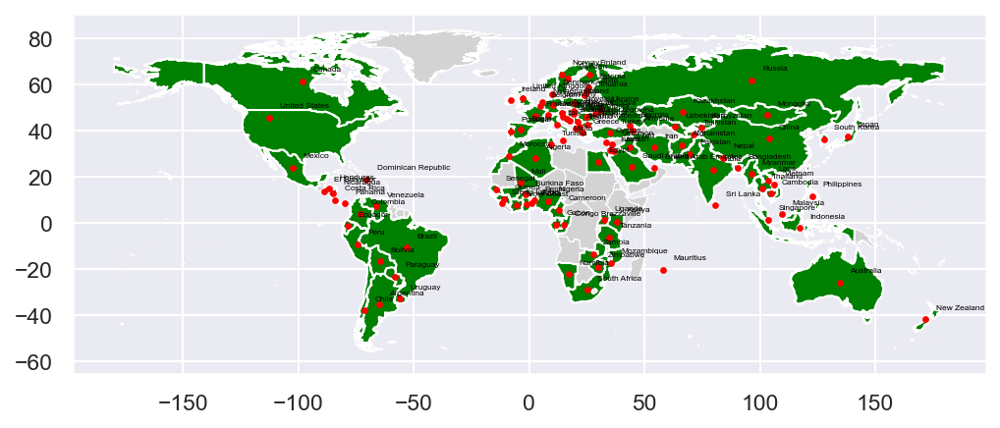

In [33]:
# Set the size of the plot
fig, ax = plt.subplots(figsize=(8, 8), dpi=150)

# Plot the base map in grey color
regions.plot(ax=ax,facecolor='lightgrey', edgecolor='white', linewidth=0.5)

# Plot the merged_first map on top of the base map
merged_first.plot(ax=plt.gca(), column='Country', color='green', edgecolor='white')
# merged_first.plot(ax=plt.gca(), column='COUNTRY', cmap='Blues', edgecolor='white', legend=True, legend_kwds={'label': 'globalregion_category'})


# add markers
for idx, row in merged_first.iterrows():
    plt.scatter(row.geometry.centroid.x, row.geometry.centroid.y, s=5, color='red')
    plt.annotate(row['Country'], xy=(row.geometry.centroid.x, row.geometry.centroid.y), xytext=(5, 5), textcoords='offset points', fontsize=4, color='black')

# show the plot
plt.show()

# Step 2. Plot the 3 main risks on a global map

## Step 2.1. Transport risks, experience and resilience

### 2.1.1 Transport perception map

In [34]:
participants = df.dropna(subset=['Q2_1'])
participants = df.groupby('Country').size().reset_index(name = 'Frequency_country')

merged_transport1 = merged[merged['Q2_1'].isin([1])]
merged_transport1 = merged_transport1.groupby('Country').size().reset_index(name = 'Frequency_risks')

merged_transport1 = pd.merge(merged_transport1, participants, on='Country')
#risk percentage
merged_transport1['Average_risks_percent'] = (merged_transport1['Frequency_risks'] / merged_transport1['Frequency_country']) * 100
# merge with the geomatrical data
merged_transport1 = merged_first.merge(merged_transport1, left_on='Country', right_on='Country')

/var/folders/c9/h5rgb9zs5p5d8dqmbtbjjq_h0000gr/T/ipykernel_3018/2265349828.py:37: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



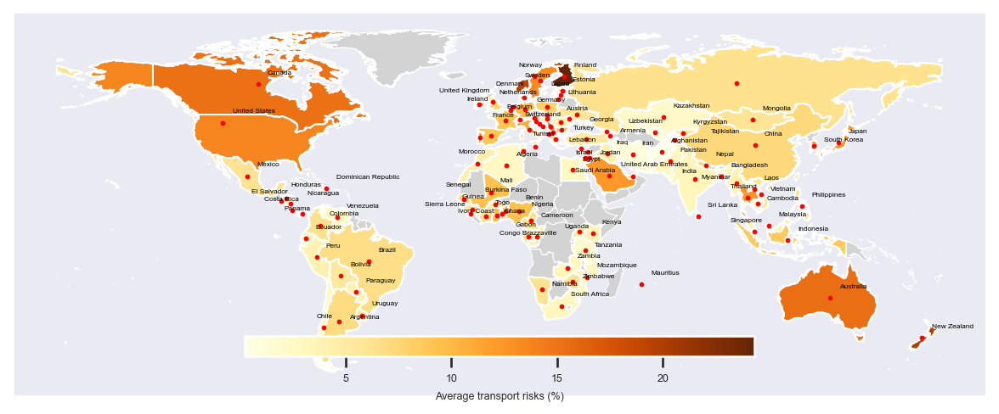

In [35]:
import matplotlib as mpl
cmap = mpl.cm.YlOrBr

# Set the size of the plot
fig, ax = plt.subplots(figsize=(8, 8), dpi=150)

# Plot the base map in grey color
regions.plot(ax=ax, facecolor='lightgrey', edgecolor='white', linewidth=0.5)

# Remove grids
ax.grid(False)

# Risk frequency
risk_plot = merged_transport1.plot(ax=ax, column='Average_risks_percent', cmap=cmap, legend=False)

# Create a colorbar within the main graph and make it horizontal
norm = plt.Normalize(merged_transport1['Average_risks_percent'].min(), merged_transport1['Average_risks_percent'].max())
cbar_ax = fig.add_axes([0.25, 0.35, 0.5, 0.02])  # Adjust the position and size of the colorbar
cbar = mcb.ColorbarBase(cbar_ax, cmap=cmap, norm=norm, orientation='horizontal')
cbar.ax.set_xlabel('Average transport risks (%)',fontsize = 6)
cbar.ax.tick_params(labelsize=6)

# Add markers and store annotations in a list
texts = []
for idx, row in merged_first.iterrows():
    ax.scatter(row.geometry.centroid.x, row.geometry.centroid.y, s=3, color='red')
    if (row['globalregion_category'] != 'Eastern Europe') &  (row['globalregion_category'] != 'Southern Europe') :
    
        texts.append(ax.annotate(row['Country'], xy=(row.geometry.centroid.x, row.geometry.centroid.y), xytext=(5, 5), textcoords='offset points', fontsize=4, color='black'))

# Optimize annotation positions to minimize overlaps
adjust_text(texts, ax=ax)

# Hide the x-axis and y-axis ticks and labels
ax.set_xticks([])
ax.set_yticks([])
plt.tight_layout()
plt.savefig('./Figures/transport_map.pdf')
# Show the plo
plt.show()


### 2.1.2. Visualise the ranked map of transport experience
To calculate the experience score, the weitages are  Both = 1, Yes,personally experienced = 0.75, Yes,know someone who has experienced = 0.5, No = 0, and DK & refused = missing 

In [36]:
# Experience traffic issues
df_traffic= df[~df['Q5E'].isin([98, 99])].copy()

df_traffic['Q5E'].replace({3: 1, 1: 0.75, 2: 0.5, 4: 0}, inplace=True)

x= df_traffic.groupby('Country').mean()['Q5E']
# merge with the geomatrical data
merged_transport_experience = merged_first.merge(x, left_on='Country', right_on='Country')
merged_transport_experience.head()

,Country,geometry,globalregion_category,Q5E
0,Afghanistan,"POLYGON ((61.27655 35.60725, 61.29638 35.62854...",South Asia,0.327856
1,Albania,"POLYGON ((19.57083 41.68527, 19.58195 41.69569...",Southern Europe,0.102307
2,Algeria,"POLYGON ((4.60335 36.88791, 4.63555 36.88638, ...",North Africa,0.311801
3,Argentina,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806...",Latin America & Caribbean,0.210000
4,Armenia,"MULTIPOLYGON (((46.54037 38.87559, 46.51639 38...",Central Asia,0.166835


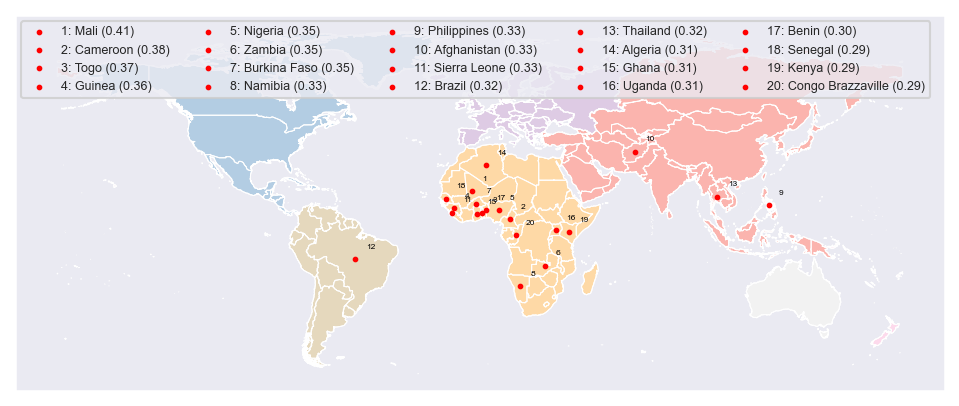

In [37]:
# Set the size of the plot
fig, ax = plt.subplots(figsize=(8, 4), dpi=150)

lands.plot(ax=ax, cmap='Pastel1', edgecolor='white', linewidth=0.5)
# Plot the base map in grey color
regions.plot(ax=ax,facecolor='none', edgecolor='white', linewidth=0.5)

# Plot the merged_first map on top of the base map
#merged_transport1.plot(ax=plt.gca(), column='Average_risks_percent', cmap='RdYlBu', edgecolor='white')
merged_transport_experience['Experience_formated'] = merged_transport_experience['Q5E'].apply(lambda x: "{:.2f}".format(x))
merged_transport_experience.loc[:,'Rank'] = merged_transport_experience['Q5E'].rank(ascending=False)
df_transport_ranked = merged_transport_experience[merged_transport_experience['Rank']<21].copy()

# add markers
for idx, row in df_transport_ranked.iterrows():
    plt.scatter(row.geometry.centroid.x, row.geometry.centroid.y, s=3, color='red')
    plt.annotate(f"{int(row['Rank'])}", xy=(row.geometry.centroid.x, row.geometry.centroid.y), xytext=(5, 5), textcoords='offset points', fontsize=4, color='black')
    
# Create a list of strings for the legend
df_transport_ranked = df_transport_ranked.sort_values(by='Rank')
legend_labels = [f'{int(row["Rank"])}: {row["Country"]} ({row["Experience_formated"]})' for _, row in df_transport_ranked.iterrows()]
plt.legend(legend_labels, loc='upper left', fontsize=6,ncol=5)

# Hide the x-axis and y-axis ticks and labels
ax.set_xticks([])
ax.set_yticks([])
plt.savefig('./Figures/transport_experience_rank_map.pdf')
# show the plot
plt.show();

### Step 2.1.3: Visualise the resilience of people with transport risks


## Step 2.2: Visualise a heat map of crime risks

In [38]:
merged_crime = merged[merged['Q2_1'].isin([3])]

merged_crime = merged_crime.groupby(['Country', 'risk_category']).size().reset_index(name='Frequency_risks')

merged_crime = pd.merge(merged_crime, participants, on='Country')
#risk percentage
merged_crime['Average_risks_percent'] = (merged_crime['Frequency_risks'] / merged_crime['Frequency_country']) * 100
# merge with the geomatrical data
merged_crime = merged_first.merge(merged_crime, left_on='Country', right_on='Country')
#merged_crime

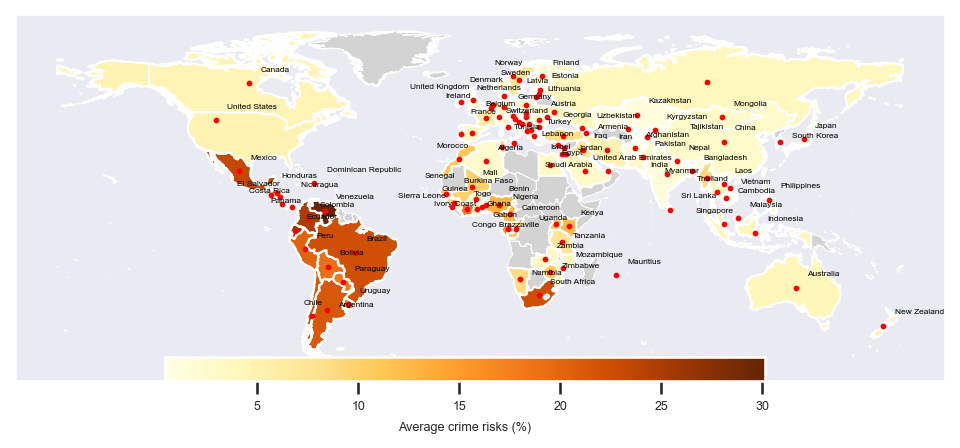

In [39]:
cmap = mpl.cm.YlOrBr
# Set the size of the plot
fig, ax = plt.subplots(figsize=(8, 8), dpi=150)

# Plot the base map in grey color
regions.plot(ax=ax, facecolor='lightgrey', edgecolor='white', linewidth=0.5)

# Remove grids
ax.grid(False)

# Risk frequency
risk_plot = merged_crime.plot(ax=ax, column='Average_risks_percent', cmap=cmap, legend=False)

# Create a colorbar within the main graph and make it horizontal
norm = plt.Normalize(merged_crime['Average_risks_percent'].min(), merged_crime['Average_risks_percent'].max())
cbar_ax = fig.add_axes([0.25, 0.35, 0.5, 0.02])  # Adjust the position and size of the colorbar
cbar = mcb.ColorbarBase(cbar_ax, cmap=cmap, norm=norm, orientation='horizontal')
cbar.ax.set_xlabel('Average crime risks (%)',fontsize = 6)
cbar.ax.tick_params(labelsize=6)

# Add markers and store annotations in a list
texts = []
for idx, row in merged_first.iterrows():
    ax.scatter(row.geometry.centroid.x, row.geometry.centroid.y, s=3, color='red')
    if (row['globalregion_category'] != 'Eastern Europe') &  (row['globalregion_category'] != 'Southern Europe') :
        texts.append(ax.annotate(row['Country'], xy=(row.geometry.centroid.x, row.geometry.centroid.y), xytext=(5, 5), textcoords='offset points', fontsize=4, color='black'))

# Optimize annotation positions to minimize overlaps
adjust_text(texts, ax=ax)

# Hide the x-axis and y-axis ticks and labels
ax.set_xticks([])
ax.set_yticks([])
#plt.tight_layout()
plt.savefig('./Figures/crime_map.pdf')
# Show the plot
plt.show()


### 2.2.2. Visualise the ranked map of crime experience
To calculate the experience score, the weitages are  Both = 1, Yes,personally experienced = 0.75, Yes,know someone who has experienced = 0.5, No = 0, and DK & refused = missing 

In [40]:
# Experience traffic issues
df_crime= df[~df['Q5C'].isin([98, 99])].copy()

df_crime['Q5C'].replace({3: 1, 1: 0.75, 2: 0.5, 4: 0}, inplace=True)

x= df_crime.groupby('Country').mean()['Q5C']
# merge with the geomatrical data
merged_crime_experience = merged_first.merge(x, left_on='Country', right_on='Country')
merged_crime_experience.head()

,Country,geometry,globalregion_category,Q5C
0,Afghanistan,"POLYGON ((61.27655 35.60725, 61.29638 35.62854...",South Asia,0.404040
1,Albania,"POLYGON ((19.57083 41.68527, 19.58195 41.69569...",Southern Europe,0.042462
2,Algeria,"POLYGON ((4.60335 36.88791, 4.63555 36.88638, ...",North Africa,0.184130
3,Argentina,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806...",Latin America & Caribbean,0.133884
4,Armenia,"MULTIPOLYGON (((46.54037 38.87559, 46.51639 38...",Central Asia,0.029175


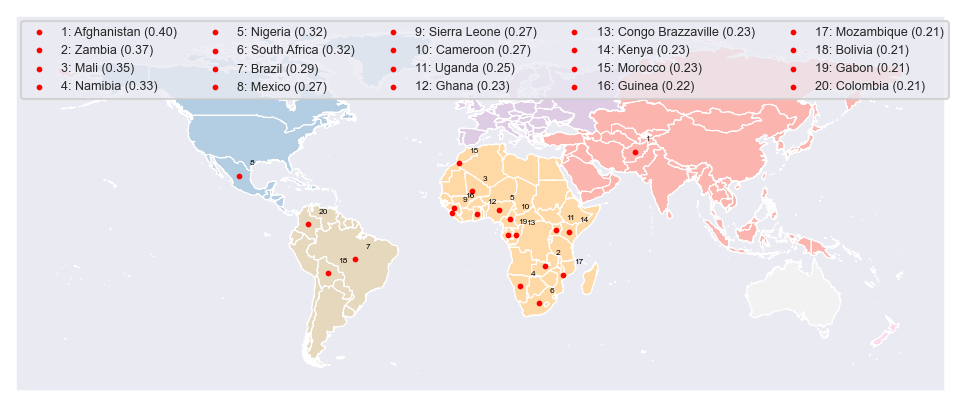

In [41]:
# Set the size of the plot
fig, ax = plt.subplots(figsize=(8, 8), dpi=150)

lands.plot(ax=ax, cmap='Pastel1', edgecolor='white', linewidth=0.5)
# Plot the base map in grey color
regions.plot(ax=ax,facecolor='none', edgecolor='white', linewidth=0.5)

# Plot the merged_first map on top of the base map
merged_crime_experience['Experience_formated'] = merged_crime_experience['Q5C'].apply(lambda x: "{:.2f}".format(x))
merged_crime_experience.loc[:,'Rank'] = merged_crime_experience['Q5C'].rank(ascending=False)
df_crime_ranked = merged_crime_experience[merged_crime_experience['Rank']<21].copy()

# add markers
for idx, row in df_crime_ranked.iterrows():
    plt.scatter(row.geometry.centroid.x, row.geometry.centroid.y, s=3, color='red')
    plt.annotate(f"{int(row['Rank'])}", xy=(row.geometry.centroid.x, row.geometry.centroid.y), xytext=(5, 5), textcoords='offset points', fontsize=4, color='black')
    
# Create a list of strings for the legend
df_crime_ranked = df_crime_ranked.sort_values(by='Rank')
legend_labels = [f'{int(row["Rank"])}: {row["Country"]} ({row["Experience_formated"]})' for _, row in df_crime_ranked.iterrows()]
plt.legend(legend_labels,  loc='upper left', fontsize=6,ncol=5)

# Hide the x-axis and y-axis ticks and labels
ax.set_xticks([])
ax.set_yticks([])
plt.savefig('./Figures/crime_experience_rank_map.pdf')
# show the plot
plt.show();

# Step 3: Make risk-related indexes

## Step 3.1 Selecting most worried risks by people

In [42]:
# worrylevel_traffic_mean
df_new_1= df[~df['Q4E'].isin([98, 99])]
expected_perception_traffic = np.mean(df_new_1['Q4E'])
# worrylevel_traffic_SD
std_perception_traffic = np.std(df_new_1['Q4E'])
# worrylevel_crime_mean
df_new_2= df[~df['Q4C'].isin([98, 99])]
expected_perception_crime = np.mean(df_new_2['Q4C'])
# # worrylevel_crime_SD
std_perception_crime = np.std(df_new_2['Q4C'])
# worrylevel_food_mean
df_new_3= df[~df['Q4A'].isin([98, 99])]
expected_perception_food = np.mean(df_new_3['Q4A'])
# # worrylevel_food_SD
std_perception_food = np.std(df_new_3['Q4A'])
# worrylevel_water_mean
df_new_4= df[~df['Q4B'].isin([98, 99])]
expected_perception_water = np.mean(df_new_4['Q4B'])
# # worrylevel_water_SD
std_perception_water = np.std(df_new_4['Q4B'])
# worrylevel_weather_mean
df_new_5= df[~df['Q4D'].isin([98, 99])]
expected_perception_weather = np.mean(df_new_5['Q4D'])
# # worrylevel_weather_SD
std_perception_weather = np.std(df_new_5['Q4D'])
# worrylevel_mental_health_mean
df_new_6= df[~df['Q4F'].isin([98, 99])]
expected_perception_health = np.mean(df_new_6['Q4F'])
# # worrylevel_mental_health_SD
std_perception_health = np.std(df_new_6['Q4F'])
# worrylevel_work_you_do_mean
df_new_7= df[~df['Q4G'].isin([98, 99])]
expected_perception_work = np.mean(df_new_7['Q4G'])
# # worrylevel_work_you_do_SD
std_perception_work = np.std(df_new_7['Q4G'])

In [43]:
mean = pd.Series([1.8510530749789385, 1.9285030299043149, 2.182904564315353, 2.3037420023835327, 1.9133533574301278, 2.256654954631144, 2.3610715228292425])
sd= pd.Series([0.7829518465178122, 0.82915454740197, 0.7773544875867079, 0.7903374432342158, 0.8041756714545396, 0.8066594199051904, 0.7573198790556099])
df_mean_sd = pd.concat ([mean,sd], axis=1)
df_mean_sd.columns = ['Mean','SD']
df_mean_sd.index = ['Traffic','Crime','Food','Water', 'Environment 2', 'Health 4', 'Work']
df_mean_sd.index.name = 'Risks'
df_mean_sd

,Mean,SD
Risks,,
Traffic,1.851053,0.782952
Crime,1.928503,0.829155
Food,2.182905,0.777354
Water,2.303742,0.790337
Environment 2,1.913353,0.804176
Health 4,2.256655,0.806659
Work,2.361072,0.757320



Based on people worryness on risks, the top three risks are traffic, crime and weather (1: very worried, 2: somewhat worried, 3: Not worried )

## Step 3.2 Calculating Perception Index, Risk Impact Index, and Resilience Index

#### For given risk (eg: crime)
$$\text{Perception Index (given country)} = \text{avg of individual perception scores of a country}$$
$$\text{Experience Index (given country)} = \text{avg of individual experience scores of a country}$$
$$\text{Risk Impact score (individual)} = \text{experience score} \times \text{perception score}$$
$$\text{Risk Impact Index (given country)} = \text{avg of individual Risk Impact scores of a country}$$

#### Resilience index for all seven risks
$$\text{Resilience Index (individual)} = \text{Average of all the individual Risk Impact Index for all risks} \times \text{Average of all the individual Readyness scores}$$

To calculate the perception score, the weitages are  very worried = 1, somewhat worried = 0.5, not worried = 0, and DK & refused = missing 
To calculate the experience score, the weitages are  Both = 1, Yes,personally experienced = 0.75, Yes,know someone who has experienced = 0.5, No = 0, and DK & refused = missing 



In [44]:
index=df.loc[:, ['GlobalRegion','Country', 'Q4A', 'Q4B','Q4C','Q4D', 'Q4E','Q4F','Q4G','Q5A','Q5B','Q5C','Q5D','Q5E','Q5F','Q5G','Q20']]
index.head()

,GlobalRegion,Country,Q4A,Q4B,Q4C,Q4D,Q4E,Q4F,Q4G,Q5A,Q5B,Q5C,Q5D,Q5E,Q5F,Q5G,Q20
0,6,United States,1.0,1.0,1.0,1.0,2.0,3.0,NaN,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1.0
1,6,United States,2.0,2.0,2.0,3.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1.0
2,6,United States,3.0,3.0,1.0,2.0,1.0,3.0,NaN,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1.0
3,6,United States,3.0,3.0,3.0,2.0,3.0,3.0,NaN,4.0,4.0,4.0,4.0,2.0,2.0,4.0,1.0
4,6,United States,3.0,3.0,2.0,3.0,2.0,3.0,3.0,2.0,4.0,4.0,4.0,2.0,2.0,4.0,1.0


In [45]:
cols_to_replace = ['Q4A', 'Q4B','Q4C','Q4D', 'Q4E','Q4F','Q4G','Q5A','Q5B','Q5C','Q5D','Q5E','Q5F','Q5G','Q20']
replace_dict = {98: np.nan, 99: np.nan}
index[cols_to_replace] = index[cols_to_replace].replace(replace_dict)
index.head()

,GlobalRegion,Country,Q4A,Q4B,Q4C,Q4D,Q4E,Q4F,Q4G,Q5A,Q5B,Q5C,Q5D,Q5E,Q5F,Q5G,Q20
0,6,United States,1.0,1.0,1.0,1.0,2.0,3.0,NaN,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1.0
1,6,United States,2.0,2.0,2.0,3.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1.0
2,6,United States,3.0,3.0,1.0,2.0,1.0,3.0,NaN,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1.0
3,6,United States,3.0,3.0,3.0,2.0,3.0,3.0,NaN,4.0,4.0,4.0,4.0,2.0,2.0,4.0,1.0
4,6,United States,3.0,3.0,2.0,3.0,2.0,3.0,3.0,2.0,4.0,4.0,4.0,2.0,2.0,4.0,1.0


In [46]:
#removing the raws if all the columns have missing values, 98, 99 
index.dropna(subset=['Q4A', 'Q4B','Q4C','Q4D', 'Q4E','Q4F','Q4G','Q5A','Q5B','Q5C','Q5D','Q5E','Q5F','Q5G','Q20'], thresh=7, inplace=True)
index.head()

,GlobalRegion,Country,Q4A,Q4B,Q4C,Q4D,Q4E,Q4F,Q4G,Q5A,Q5B,Q5C,Q5D,Q5E,Q5F,Q5G,Q20
0,6,United States,1.0,1.0,1.0,1.0,2.0,3.0,NaN,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1.0
1,6,United States,2.0,2.0,2.0,3.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1.0
2,6,United States,3.0,3.0,1.0,2.0,1.0,3.0,NaN,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1.0
3,6,United States,3.0,3.0,3.0,2.0,3.0,3.0,NaN,4.0,4.0,4.0,4.0,2.0,2.0,4.0,1.0
4,6,United States,3.0,3.0,2.0,3.0,2.0,3.0,3.0,2.0,4.0,4.0,4.0,2.0,2.0,4.0,1.0


In [47]:
# replace the values 2 with 0.5 and 3 with 0
index.loc[:, ['Q4A', 'Q4B','Q4C','Q4D', 'Q4E','Q4F','Q4G']] = index.loc[:, ['Q4A', 'Q4B','Q4C','Q4D', 'Q4E','Q4F','Q4G']].replace({2: 0.5, 3: 0})
index.loc[:, ['Q5A','Q5B','Q5C','Q5D','Q5E','Q5F','Q5G']] = index.loc[:, ['Q5A','Q5B','Q5C','Q5D','Q5E','Q5F','Q5G']].replace({3: 1, 1: 0.75, 2: 0.5, 4: 0})
index.loc[:, ['Q20']] = index.loc[:, ['Q20']].replace({3: 0.5, 2: 0})
index.head()

,GlobalRegion,Country,Q4A,Q4B,Q4C,Q4D,Q4E,Q4F,Q4G,Q5A,Q5B,Q5C,Q5D,Q5E,Q5F,Q5G,Q20
0,6,United States,1.0,1.0,1.0,1.0,0.5,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,6,United States,0.5,0.5,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,6,United States,0.0,0.0,1.0,0.5,1.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,6,United States,0.0,0.0,0.0,0.5,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.5,0.5,0.0,1.0
4,6,United States,0.0,0.0,0.5,0.0,0.5,0.0,0.0,0.5,0.0,0.0,0.0,0.5,0.5,0.0,1.0


In [48]:
# define a function to compute the average of the non-ignored values in each row for perception score (worry) and experience score)
def compute_average(row):
    valid_values = [value for value in row if not pd.isna(value)]
    if len(valid_values) > 0:
        return np.mean(valid_values)
    else:
        return np.nan

# create a new column with the computed average
index['overall_perception_score'] = index.loc[:, ['Q4A', 'Q4B','Q4C','Q4D', 'Q4E','Q4F','Q4G']].apply(compute_average, axis=1)
index['overall_experience_score'] = index.loc[:, ['Q5A','Q5B','Q5C','Q5D','Q5E','Q5F','Q5G']].apply(compute_average, axis=1)
index.head()

,GlobalRegion,Country,Q4A,Q4B,Q4C,Q4D,Q4E,Q4F,Q4G,Q5A,Q5B,Q5C,Q5D,Q5E,Q5F,Q5G,Q20,overall_perception_score,overall_experience_score
0,6,United States,1.0,1.0,1.0,1.0,0.5,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.750000,0.000000
1,6,United States,0.5,0.5,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.214286,0.000000
2,6,United States,0.0,0.0,1.0,0.5,1.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.416667,0.000000
3,6,United States,0.0,0.0,0.0,0.5,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.5,0.5,0.0,1.0,0.083333,0.142857
4,6,United States,0.0,0.0,0.5,0.0,0.5,0.0,0.0,0.5,0.0,0.0,0.0,0.5,0.5,0.0,1.0,0.142857,0.214286


In [49]:
#rename the columns
index = index.rename(columns={'Q4A': 'Food_worry', 'Q4B': 'water_worry','Q4C': 'crime_worry', 'Q4D': 'weather_worry', 'Q4E': 'traffic_worry','Q4F': 'mental_health_worry','Q4G': 'work_worry','Q5A': 'Food_experience', 'Q5B': 'water_experience','Q5C': 'crime_experience', 'Q5D': 'weather_experience', 'Q5E': 'traffic_experience','Q5F': 'mental_health_experience','Q5G': 'work_experience', 'Q20': 'readiness_score'})
index.head()

,GlobalRegion,Country,Food_worry,water_worry,crime_worry,weather_worry,traffic_worry,mental_health_worry,work_worry,Food_experience,water_experience,crime_experience,weather_experience,traffic_experience,mental_health_experience,work_experience,readiness_score,overall_perception_score,overall_experience_score
0,6,United States,1.0,1.0,1.0,1.0,0.5,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.750000,0.000000
1,6,United States,0.5,0.5,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.214286,0.000000
2,6,United States,0.0,0.0,1.0,0.5,1.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.416667,0.000000
3,6,United States,0.0,0.0,0.0,0.5,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.5,0.5,0.0,1.0,0.083333,0.142857
4,6,United States,0.0,0.0,0.5,0.0,0.5,0.0,0.0,0.5,0.0,0.0,0.0,0.5,0.5,0.0,1.0,0.142857,0.214286


In [50]:
#calculating Individual impact for each country from each risk
index['risk_impact_food'] = index['Food_worry'] * index['Food_experience']
index['risk_impact_water'] = index['water_worry'] * index['water_experience']
index['risk_impact_crime'] = index['crime_worry'] * index['crime_experience']
index['risk_impact_weather'] = index['weather_worry'] * index['weather_experience']
index['risk_impact_traffic'] = index['traffic_worry'] * index['traffic_experience']
index['risk_impact_mental_health'] = index['mental_health_worry'] * index['mental_health_experience']
index['risk_impact_work'] = index['work_worry'] * index['work_experience']
index['overall_risk_impact_score'] = index['overall_perception_score'] * index['overall_experience_score']
index.head()

,GlobalRegion,Country,Food_worry,water_worry,crime_worry,weather_worry,traffic_worry,mental_health_worry,work_worry,Food_experience,...,overall_perception_score,overall_experience_score,risk_impact_food,risk_impact_water,risk_impact_crime,risk_impact_weather,risk_impact_traffic,risk_impact_mental_health,risk_impact_work,overall_risk_impact_score
0,6,United States,1.0,1.0,1.0,1.0,0.5,0.0,NaN,0.0,...,0.750000,0.000000,0.0,0.0,0.0,0.0,0.00,0.0,NaN,0.000000
1,6,United States,0.5,0.5,0.5,0.0,0.0,0.0,0.0,0.0,...,0.214286,0.000000,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.000000
2,6,United States,0.0,0.0,1.0,0.5,1.0,0.0,NaN,0.0,...,0.416667,0.000000,0.0,0.0,0.0,0.0,0.00,0.0,NaN,0.000000
3,6,United States,0.0,0.0,0.0,0.5,0.0,0.0,NaN,0.0,...,0.083333,0.142857,0.0,0.0,0.0,0.0,0.00,0.0,NaN,0.011905
4,6,United States,0.0,0.0,0.5,0.0,0.5,0.0,0.0,0.5,...,0.142857,0.214286,0.0,0.0,0.0,0.0,0.25,0.0,0.0,0.030612


## Step 3.3. Comparison of mean impact index from each region. 

In [51]:
#Make Africa Scatterpolar chart
Region = Africa
Categories = ['Food','Water','Crime','Serious Weather','Traffic','Mental health','Work accident']
Col = ['risk_impact_food','risk_impact_water','risk_impact_crime','risk_impact_weather','risk_impact_traffic','risk_impact_mental_health','risk_impact_work']
layout = go.Layout(
    autosize=True,  # Enable autosizing
    width=500,  # Adjust the width of the plot
    height=400,  # Adjust the height of the plot
    margin=dict(l=5, r=0, t=15, b=2)  # Set the left, right, top, and bottom margins to zero
)

fig = go.Figure( layout=layout)

for m in range(1,4):
    dfm = index.loc[df.GlobalRegion==m,Col]
    dfm.dropna(inplace=True)
#     dfm = dfm[dfm<5]
#     dfm.replace({4: 0, 3: 1, 2: 0.5, 1:0.75}, inplace=True)
    value= dfm.mean()

    fig.add_trace(go.Scatterpolar(
        theta=Categories,
        r=value,
        name=Region[m],
        fill='toself'
        
    ))

min_value = 0
max_value = 0.35

fig.update_layout(
    polar=dict(
        radialaxis=dict(
            range=[min_value, max_value]  # Set the minimum and maximum values for the r-axis
        )
    ),
    legend=dict(yanchor="top", y=-0.15, xanchor="left", x=0.4),
    legend_orientation="v"
)

pio.write_image(fig,'./Figures/Risks_impact_Africa.pdf')

fig.show()

In [52]:
Region = AmericaANZ
Categories = ['Food','Water','Crime','Serious Weather','Traffic','Mental health','Work accident']
Col = ['risk_impact_food','risk_impact_water','risk_impact_crime','risk_impact_weather','risk_impact_traffic','risk_impact_mental_health','risk_impact_work']
layout = go.Layout(
    autosize=True,  # Enable autosizing
    width=500,  # Adjust the width of the plot
    height=400,  # Adjust the height of the plot
    margin=dict(l=5, r=0, t=15, b=2)  # Set the left, right, top, and bottom margins to zero
)
fig = go.Figure(layout=layout)
count0=0
for m in [5,6,15]:
    dfm = index.loc[df.GlobalRegion==m,Col]
    dfm.dropna(inplace=True)
#     dfm = dfm[dfm<5]
#     dfm.replace({4: 0, 3: 1, 2: 0.5, 1:0.75}, inplace=True)
    value= dfm.mean()

    fig.add_trace(go.Scatterpolar(
        theta=Categories,
        r=value,
        name=Region[count0],
        fill='toself'
        
    ))
    count0+=1

min_value = 0
max_value = 0.35

fig.update_layout(
    polar=dict(
        radialaxis=dict(
            range=[min_value, max_value]  # Set the minimum and maximum values for the r-axis
        )
    ),
    legend=dict(yanchor="top", y=-0.15, xanchor="left", x=0.4),
    legend_orientation="v"
)

pio.write_image(fig,'./Figures/Risks_impact_AmericaANZ.pdf') 
fig.show()

In [53]:
Region = Asia
Categories = ['Food','Water','Crime','Serious Weather','Traffic','Mental health','Work accident']
Col = ['risk_impact_food','risk_impact_water','risk_impact_crime','risk_impact_weather','risk_impact_traffic','risk_impact_mental_health','risk_impact_work']
layout = go.Layout(
    autosize=True,  # Enable autosizing
    width=500,  # Adjust the width of the plot
    height=400,  # Adjust the height of the plot
    margin=dict(l=5, r=0, t=15, b=2)  # Set the left, right, top, and bottom margins to zero
)
fig = go.Figure(layout=layout)
count0=0
for m in range(7,12):
    dfm = index.loc[df.GlobalRegion==m,Col]
    dfm.dropna(inplace=True)
    # dfm = dfm[dfm<5]
    # dfm.replace({4: 0, 3: 1, 2: 0.5, 1:0.75}, inplace=True)
    value= dfm.mean()

    fig.add_trace(go.Scatterpolar(
        theta=Categories,
        r=value,
        name=Region[count0],
        fill='toself'
        
    ))
    count0+=1

min_value = 0
max_value = 0.35

fig.update_layout(
    polar=dict(
        radialaxis=dict(
            range=[min_value, max_value]  # Set the minimum and maximum values for the r-axis
        )
    ),
    legend=dict(yanchor="top", y=-0.15, xanchor="left", x=0.4),
    legend_orientation="v"
)

pio.write_image(fig,'./Figures/Risks_impact_Asia.pdf') 
fig.show()

In [54]:
Region = Europe
Categories = ['Food','Water','Crime','Serious Weather','Traffic','Mental health','Work accident']
Col = ['risk_impact_food','risk_impact_water','risk_impact_crime','risk_impact_weather','risk_impact_traffic','risk_impact_mental_health','risk_impact_work']
layout = go.Layout(
    autosize=True,  # Enable autosizing
    width=500,  # Adjust the width of the plot
    height=400,  # Adjust the height of the plot
    margin=dict(l=5, r=0, t=15, b=2)  # Set the left, right, top, and bottom margins to zero
)
fig = go.Figure(layout=layout)
count0=0
for m in [12,13,14]:
    dfm = index.loc[df.GlobalRegion==m,Col]
    dfm.dropna(inplace=True)
    # dfm = dfm[dfm<5]
    # dfm.replace({4: 0, 3: 1, 2: 0.5, 1:0.75}, inplace=True)
    value= dfm.mean()

    fig.add_trace(go.Scatterpolar(
        theta=Categories,
        r=value,
        name=Region[count0],
        fill='toself'
        
    ))
    count0+=1

min_value = 0
max_value = 0.35

fig.update_layout(
    polar=dict(
        radialaxis=dict(
            range=[min_value, max_value]  # Set the minimum and maximum values for the r-axis
        )
    ),
    legend=dict(yanchor="top", y=-0.15, xanchor="left", x=0.4),
    legend_orientation="v"
)

pio.write_image(fig,'./Figures/Risks_impact_Europe.pdf') 
fig.show()

In [55]:
mean_scores = index.groupby('Country').agg({'overall_perception_score': 'mean', 'overall_experience_score': 'mean', 'overall_risk_impact_score': 'mean', 'readiness_score': 'mean','Food_worry': 'mean', 'water_worry': 'mean', 'crime_worry': 'mean', 'weather_worry': 'mean', 'traffic_worry': 'mean', 'mental_health_worry': 'mean', 'work_worry': 'mean', 'Food_experience': 'mean', 'water_experience': 'mean', 'crime_experience': 'mean', 'weather_experience': 'mean', 'traffic_experience': 'mean', 'mental_health_experience': 'mean', 'work_experience': 'mean', 'risk_impact_food': 'mean','risk_impact_water': 'mean','risk_impact_crime': 'mean','risk_impact_weather': 'mean','risk_impact_traffic': 'mean','risk_impact_mental_health': 'mean','risk_impact_work': 'mean'}).reset_index()
mean_scores = mean_scores.rename(columns={'overall_perception_score': 'perception_index', 'overall_experience_score': 'experience_index', 'overall_risk_impact_score': 'risk_impact_index','readiness_score': 'readiness_index', 'Food_worry': 'Perception_index_food', 'water_worry': 'Perception_index_water', 'crime_worry': 'Perception_index_crime', 'weather_worry': 'Perception_index_weather', 'traffic_worry': 'Perception_index_traffic',  'mental_health_worry': 'Perception_index_mental_health', 'work_worry': 'Perception_index_work','Food_experience': 'experience_index_food', 'water_experience': 'experience_index_water','crime_experience': 'experience_index_crime', 'weather_experience': 'experience_index_weather', 'traffic_experience': 'experience_index_traffic','mental_health_experience': 'experience_index_mental_health', 'work_experience': 'experience_index_work','risk_impact_food': 'risk_impact_index_food','risk_impact_water': 'risk_impact_index_water','risk_impact_crime': 'risk_impact_index_crime','risk_impact_weather': 'risk_impact_index_weather','risk_impact_traffic': 'risk_impact_index_traffic','risk_impact_mental_health': 'risk_impact_index_mental_health','risk_impact_work': 'risk_impact_index_work' })
mean_scores.head()

,Country,perception_index,experience_index,risk_impact_index,readiness_index,Perception_index_food,Perception_index_water,Perception_index_crime,Perception_index_weather,Perception_index_traffic,...,experience_index_traffic,experience_index_mental_health,experience_index_work,risk_impact_index_food,risk_impact_index_water,risk_impact_index_crime,risk_impact_index_weather,risk_impact_index_traffic,risk_impact_index_mental_health,risk_impact_index_work
0,Afghanistan,0.504098,0.350008,0.217335,0.341858,0.385155,0.345190,0.736069,0.549231,0.474846,...,0.327856,0.439524,0.323498,0.186173,0.175805,0.356339,0.255847,0.207132,0.342541,0.152985
1,Albania,0.466912,0.066757,0.041336,0.239796,0.556056,0.494494,0.385743,0.415075,0.650505,...,0.102307,0.065010,0.042169,0.059362,0.039653,0.025583,0.062248,0.079833,0.047734,0.027612
2,Algeria,0.417045,0.179415,0.086729,0.375000,0.310521,0.324695,0.637205,0.477273,0.517116,...,0.311417,0.093910,0.123457,0.126156,0.094584,0.136694,0.074395,0.200052,0.049208,0.084452
3,Argentina,0.461948,0.152959,0.085949,0.567368,0.413741,0.410410,0.610611,0.533033,0.597793,...,0.210000,0.162000,0.141109,0.053860,0.081456,0.108952,0.161949,0.145457,0.087212,0.067838
4,Armenia,0.322071,0.090433,0.039543,0.574682,0.456609,0.273092,0.236298,0.357287,0.405961,...,0.166835,0.085347,0.061235,0.091223,0.047980,0.015479,0.040265,0.101498,0.052810,0.033333


In [56]:
mean_scores.isnull().any()

Country                            False
perception_index                   False
experience_index                   False
risk_impact_index                  False
readiness_index                    False
Perception_index_food              False
Perception_index_water             False
Perception_index_crime             False
Perception_index_weather           False
Perception_index_traffic           False
Perception_index_mental_health     False
Perception_index_work              False
experience_index_food              False
experience_index_water             False
experience_index_crime             False
experience_index_weather           False
experience_index_traffic           False
experience_index_mental_health     False
experience_index_work              False
risk_impact_index_food             False
risk_impact_index_water            False
risk_impact_index_crime            False
risk_impact_index_weather          False
risk_impact_index_traffic          False
risk_impact_inde

In [57]:
zeros_present = (mean_scores == 0).any()
zeros_present

Country                            False
perception_index                   False
experience_index                   False
risk_impact_index                  False
readiness_index                    False
Perception_index_food              False
Perception_index_water             False
Perception_index_crime             False
Perception_index_weather           False
Perception_index_traffic           False
Perception_index_mental_health     False
Perception_index_work              False
experience_index_food              False
experience_index_water             False
experience_index_crime             False
experience_index_weather           False
experience_index_traffic           False
experience_index_mental_health     False
experience_index_work              False
risk_impact_index_food             False
risk_impact_index_water            False
risk_impact_index_crime            False
risk_impact_index_weather          False
risk_impact_index_traffic          False
risk_impact_inde

In [58]:
# keep only the 'Country' and 'Global Region' columns from worry
index_region = index[['Country', 'GlobalRegion']]

# remove any duplicate rows for each country
index_region = index_region.drop_duplicates(subset='Country', keep='first')

# reset the index of the dataframe
index_region = index_region.reset_index(drop=True)

# Define a dictionary to map the numbers to the region names
region_map = {
    1: 'Eastern Africa',
    2: 'Central/Western Africa',
    3: 'North Africa',
    4: 'Southern Africa',
    5: 'Latin America & Caribbean',
    6: 'Northern America',
    7: 'Central Asia',
    8: 'East Asia',
    9: 'South-eastern Asia',
    10: 'South Asia',
    11: 'Middle East',
    12: 'Eastern Europe',
    13: 'Northern/Western Europe',
    14: 'Southern Europe',
    15: 'Australia and New Zealand'
}

# Use the replace method to replace the numbers with the region names
index_region['GlobalRegion'] = index_region['GlobalRegion'].replace(region_map)
index_region.head()

,Country,GlobalRegion
0,United States,Northern America
1,Egypt,North Africa
2,Morocco,North Africa
3,Lebanon,Middle East
4,Saudi Arabia,Middle East


In [59]:
index_scores = mean_scores.merge(index_region, on='Country')
index_scores.head()

,Country,perception_index,experience_index,risk_impact_index,readiness_index,Perception_index_food,Perception_index_water,Perception_index_crime,Perception_index_weather,Perception_index_traffic,...,experience_index_mental_health,experience_index_work,risk_impact_index_food,risk_impact_index_water,risk_impact_index_crime,risk_impact_index_weather,risk_impact_index_traffic,risk_impact_index_mental_health,risk_impact_index_work,GlobalRegion
0,Afghanistan,0.504098,0.350008,0.217335,0.341858,0.385155,0.345190,0.736069,0.549231,0.474846,...,0.439524,0.323498,0.186173,0.175805,0.356339,0.255847,0.207132,0.342541,0.152985,South Asia
1,Albania,0.466912,0.066757,0.041336,0.239796,0.556056,0.494494,0.385743,0.415075,0.650505,...,0.065010,0.042169,0.059362,0.039653,0.025583,0.062248,0.079833,0.047734,0.027612,Southern Europe
2,Algeria,0.417045,0.179415,0.086729,0.375000,0.310521,0.324695,0.637205,0.477273,0.517116,...,0.093910,0.123457,0.126156,0.094584,0.136694,0.074395,0.200052,0.049208,0.084452,North Africa
3,Argentina,0.461948,0.152959,0.085949,0.567368,0.413741,0.410410,0.610611,0.533033,0.597793,...,0.162000,0.141109,0.053860,0.081456,0.108952,0.161949,0.145457,0.087212,0.067838,Latin America & Caribbean
4,Armenia,0.322071,0.090433,0.039543,0.574682,0.456609,0.273092,0.236298,0.357287,0.405961,...,0.085347,0.061235,0.091223,0.047980,0.015479,0.040265,0.101498,0.052810,0.033333,Central Asia


In [60]:
index_scores.isna().sum()

Country                            0
perception_index                   0
experience_index                   0
risk_impact_index                  0
readiness_index                    0
Perception_index_food              0
Perception_index_water             0
Perception_index_crime             0
Perception_index_weather           0
Perception_index_traffic           0
Perception_index_mental_health     0
Perception_index_work              0
experience_index_food              0
experience_index_water             0
experience_index_crime             0
experience_index_weather           0
experience_index_traffic           0
experience_index_mental_health     0
experience_index_work              0
risk_impact_index_food             0
risk_impact_index_water            0
risk_impact_index_crime            0
risk_impact_index_weather          0
risk_impact_index_traffic          0
risk_impact_index_mental_health    0
risk_impact_index_work             0
GlobalRegion                       0
d

In [61]:
#overall resilience index
index_scores['resilience_index'] = index_scores['risk_impact_index'] * index_scores['readiness_index']
index_scores.head()

,Country,perception_index,experience_index,risk_impact_index,readiness_index,Perception_index_food,Perception_index_water,Perception_index_crime,Perception_index_weather,Perception_index_traffic,...,experience_index_work,risk_impact_index_food,risk_impact_index_water,risk_impact_index_crime,risk_impact_index_weather,risk_impact_index_traffic,risk_impact_index_mental_health,risk_impact_index_work,GlobalRegion,resilience_index
0,Afghanistan,0.504098,0.350008,0.217335,0.341858,0.385155,0.345190,0.736069,0.549231,0.474846,...,0.323498,0.186173,0.175805,0.356339,0.255847,0.207132,0.342541,0.152985,South Asia,0.074298
1,Albania,0.466912,0.066757,0.041336,0.239796,0.556056,0.494494,0.385743,0.415075,0.650505,...,0.042169,0.059362,0.039653,0.025583,0.062248,0.079833,0.047734,0.027612,Southern Europe,0.009912
2,Algeria,0.417045,0.179415,0.086729,0.375000,0.310521,0.324695,0.637205,0.477273,0.517116,...,0.123457,0.126156,0.094584,0.136694,0.074395,0.200052,0.049208,0.084452,North Africa,0.032523
3,Argentina,0.461948,0.152959,0.085949,0.567368,0.413741,0.410410,0.610611,0.533033,0.597793,...,0.141109,0.053860,0.081456,0.108952,0.161949,0.145457,0.087212,0.067838,Latin America & Caribbean,0.048765
4,Armenia,0.322071,0.090433,0.039543,0.574682,0.456609,0.273092,0.236298,0.357287,0.405961,...,0.061235,0.091223,0.047980,0.015479,0.040265,0.101498,0.052810,0.033333,Central Asia,0.022725


## Step 3.4. Comparison with traffic statistical data

In [62]:
df_traffic = pd.read_csv("shapefiles/traffic.csv")
df_traffic.head()

,Country,Year,Estimated number of road traffic deaths,Estimated road traffic death rate (per 100 000 population)
0,Afghanistan,2019,6033 [5227-6846],15.9 [13.7-18.0]
1,Afghanistan,2018,5295 [4578-6017],14.2 [12.3-16.2]
2,Afghanistan,2017,5490 [4737-6246],15.1 [13.1-17.2]
3,Afghanistan,2016,5240 [4512-5970],14.8 [12.8-16.9]
4,Afghanistan,2015,4942 [4248-5637],14.4 [12.3-16.4]


In [63]:
# remove the part in brackets and convert the remaining string to integer
df_traffic['Estimated number of road traffic deaths'] = df_traffic['Estimated number of road traffic deaths'].str.replace(r'\[.*\]', '').astype(int)
df_traffic['Estimated road traffic death rate (per 100 000 population)'] = df_traffic['Estimated road traffic death rate (per 100 000 population)'].str.replace(r'\[.*\]', '').astype(float)
df_traffic= df_traffic[df_traffic['Year'].isin([2019])]

/var/folders/c9/h5rgb9zs5p5d8dqmbtbjjq_h0000gr/T/ipykernel_3018/1495670512.py:2: FutureWarning:

The default value of regex will change from True to False in a future version.

/var/folders/c9/h5rgb9zs5p5d8dqmbtbjjq_h0000gr/T/ipykernel_3018/1495670512.py:3: FutureWarning:

The default value of regex will change from True to False in a future version.



In [64]:
#rename the countries in statistical traffic data as Poll data survey
df_traffic['Country'] = df_traffic['Country'].replace('Bolivia (Plurinational State of)', 'Bolivia')
df_traffic['Country'] = df_traffic['Country'].replace('Bosnia and Herzegovina', 'Bosnia Herzegovina')
df_traffic['Country'] = df_traffic['Country'].replace('Congo', 'Congo Brazzaville')
df_traffic['Country'] = df_traffic['Country'].replace('Czechia', 'Czech Republic')
df_traffic['Country'] = df_traffic['Country'].replace('Iran (Islamic Republic of)', 'Iran')
df_traffic['Country'] = df_traffic['Country'].replace("Côte d'Ivoire", 'Ivory Coast')
df_traffic['Country'] = df_traffic['Country'].replace("Lao People's Democratic Republic", 'Laos')
df_traffic['Country'] = df_traffic['Country'].replace('Republic of Moldova', 'Moldova')
df_traffic['Country'] = df_traffic['Country'].replace('Russian Federation', 'Russia')
df_traffic['Country'] = df_traffic['Country'].replace('Republic of Korea', 'South Korea')
df_traffic['Country'] = df_traffic['Country'].replace('United Republic of Tanzania', 'Tanzania')
df_traffic['Country'] = df_traffic['Country'].replace('Türkiye', 'Turkey')
df_traffic['Country'] = df_traffic['Country'].replace('United Kingdom of Great Britain and Northern Ireland', 'United Kingdom')
df_traffic['Country'] = df_traffic['Country'].replace('United States of America', 'United States')
df_traffic['Country'] = df_traffic['Country'].replace('Venezuela (Bolivarian Republic of)', 'Venezuela')
df_traffic['Country'] = df_traffic['Country'].replace('Viet Nam', 'Vietnam')

In [65]:
merged_traffic = df_traffic.merge(index_scores, on='Country', how='inner')
merged_traffic.head()

,Country,Year,Estimated number of road traffic deaths,Estimated road traffic death rate (per 100 000 population),perception_index,experience_index,risk_impact_index,readiness_index,Perception_index_food,Perception_index_water,...,experience_index_work,risk_impact_index_food,risk_impact_index_water,risk_impact_index_crime,risk_impact_index_weather,risk_impact_index_traffic,risk_impact_index_mental_health,risk_impact_index_work,GlobalRegion,resilience_index
0,Afghanistan,2019,6033,15.9,0.504098,0.350008,0.217335,0.341858,0.385155,0.345190,...,0.323498,0.186173,0.175805,0.356339,0.255847,0.207132,0.342541,0.152985,South Asia,0.074298
1,Albania,2019,337,11.7,0.466912,0.066757,0.041336,0.239796,0.556056,0.494494,...,0.042169,0.059362,0.039653,0.025583,0.062248,0.079833,0.047734,0.027612,Southern Europe,0.009912
2,Algeria,2019,8996,20.9,0.417045,0.179415,0.086729,0.375000,0.310521,0.324695,...,0.123457,0.126156,0.094584,0.136694,0.074395,0.200052,0.049208,0.084452,North Africa,0.032523
3,Argentina,2019,6298,14.1,0.461948,0.152959,0.085949,0.567368,0.413741,0.410410,...,0.141109,0.053860,0.081456,0.108952,0.161949,0.145457,0.087212,0.067838,Latin America & Caribbean,0.048765
4,Armenia,2019,590,20.0,0.322071,0.090433,0.039543,0.574682,0.456609,0.273092,...,0.061235,0.091223,0.047980,0.015479,0.040265,0.101498,0.052810,0.033333,Central Asia,0.022725


### Step 3.5 Traffic perception vs Traffic Experience index

In [66]:
# Define the region categories
Africa = ['Eastern Africa', 'Central/Western Africa', 'North Africa', 'Southern Africa']
North_America = ['Northern America']
South_America = ['Latin America & Caribbean']
Oceania = ['Australia and New Zealand'] 
Asia = ['Central Asia', 'East Asia', 'South-eastern Asia', 'South Asia', 'Middle East']
Europe = ['Eastern Europe', 'Northern/Western Europe', 'Southern Europe']

# Function to map country to region category
def map_region_category(country):
    if country in Africa:
        return 'Africa'
    elif country in North_America:
        return 'North America'
    elif country in South_America:
        return 'South America'
    elif country in Oceania:
        return 'Oceania'
    elif country in Asia:
        return 'Asia'
    elif country in Europe:
        return 'Europe'
    else:
        return 'Other'


# Create a custom color palette for each region category
color_palette = {
    'Africa': 'orange',
    'North America': 'green',
    'South America': 'Pink',
    'Asia': 'blue',
    'Europe': 'red',
    'Oceania': 'Yellow',
}

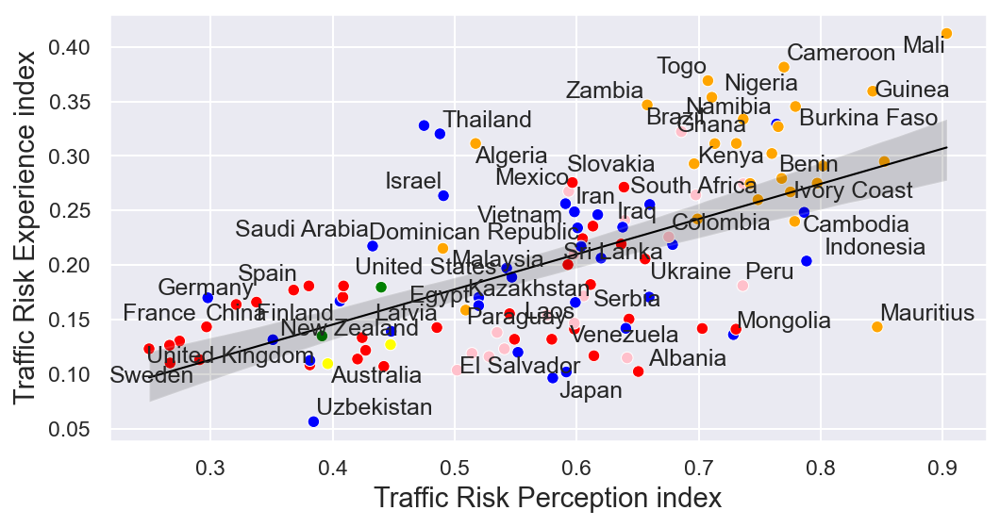

In [67]:
# List of countries to label
countries_to_label = ['United Kingdom','Malaysia','Albania','Mongolia','Macedonia','Zambia','Nigeria','Benin','Burkina Faso','Togo','Cameroon','Mali','Finland','Egypt','Latvia','Kazakhstan','Paraguay','United States','Germany','Spain','Afganistan','Thailan','Algeria','Peru','Indonesia','Serbia','Ukraine','Colombia','Uzbekistan','Guinea','Mali','Dominican Republic','Venezuela','Saudi Arabia','Namibia','Thailand','El Salvador','Paraguay','New Zealand','Australia','United States','China','Mexico','Israel','Slovakia','Vietnam','Iraq','Nigeria','Ghana','Namibia','Sri Lanka','Iran','Cambodia','Kenya','Ivory Coast','Brazil','South Africa','Togo','China','Mexico','Laos','Sweden','France','Japan','Mauritius']
#countries_to_label = merged_traffic.Country.unique()

# Set the size of the plot
fig, ax = plt.subplots(figsize=(8, 4), dpi=150)

# Apply the function to create the 'RegionCategory' column
merged_traffic['RegionCategory'] = merged_traffic['GlobalRegion'].apply(map_region_category)

sns.scatterplot(
    data=merged_traffic,
    x='Perception_index_traffic',
    y='experience_index_traffic',
    hue='RegionCategory',
    palette=color_palette
)
texts=[]
# Add country names as labels to the points
for i, row in merged_traffic.iterrows():
    if row['Country'] in countries_to_label:
        texts.append(plt.text(row['Perception_index_traffic'], row['experience_index_traffic'], row['Country'], fontsize=12))


# Add a regression line
sns.regplot(
    data=merged_traffic,
    x='Perception_index_traffic',
    y='experience_index_traffic',
    scatter=False,  # Set to False to avoid plotting data points again
    color='black',  # Set the color of the regression line
    line_kws={"linewidth": 1}  # Set the line width of the regression line
)

# Set x and y axis labels
plt.xlabel('Traffic Risk Perception index', fontsize=14)
plt.ylabel('Traffic Risk Experience index', fontsize=14)

adjust_text(texts, ax=ax,force_text=0.01)
#plt.legend(handles=legend_handles, loc='upper left', fontsize=14)  #bbox_to_anchor=(1.05, 1),
#plt.legend(loc='upper left', fontsize=12)  #bbox_to_anchor=(1.05, 1),
plt.legend('', frameon=False)

plt.savefig('./Figures/traffic_perception_experience.pdf',bbox_inches='tight')

# Display the plot
plt.show()

## Step 3.6. Traffic impact vs Actual

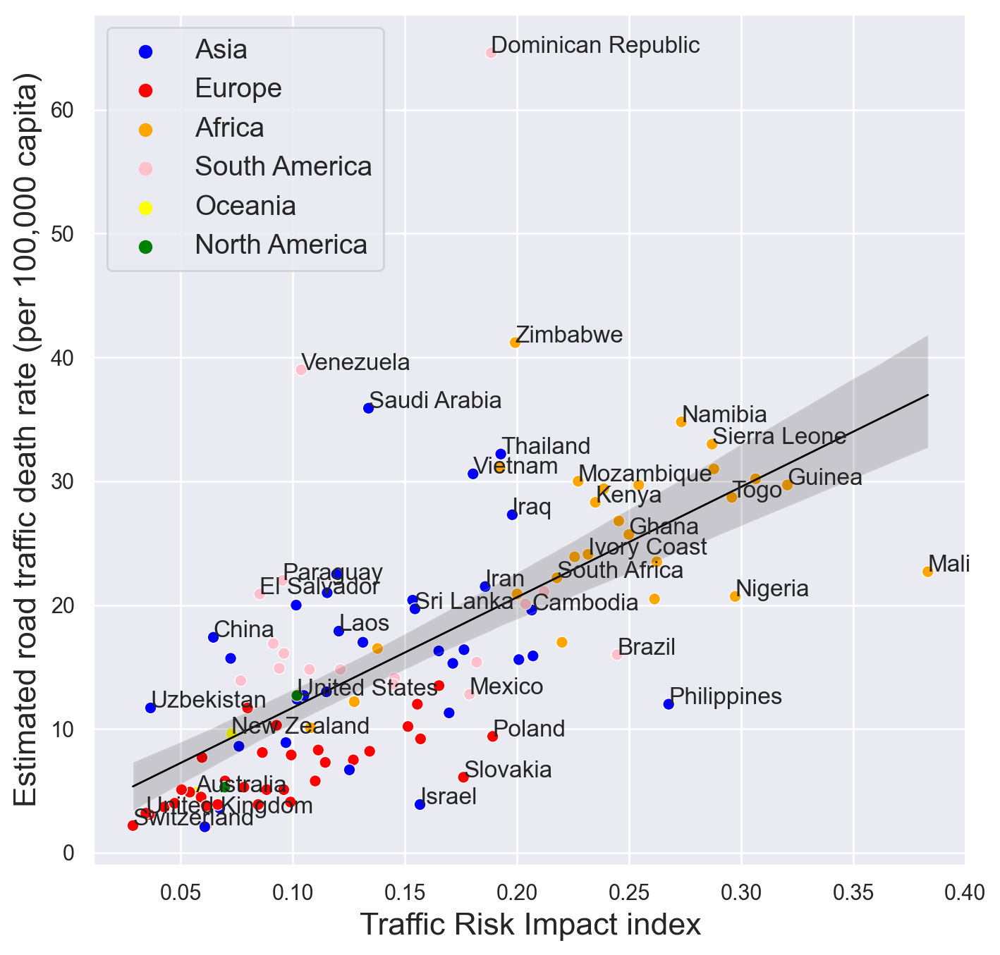

In [68]:
# List of countries to label
countries_to_label = ['Switzerland','United Kingdom','Uzbekistan','Guinea','Mali','Dominican Republic','Zimbabwe','Venezuela','Saudi Arabia','Namibia','Sierra Leone','Thailand','El Salvador','Paraguay','New Zealand','Australia','United States','China','Mexico','Philippines','Israel','Slovakia','Poland','Vietnam','Iraq','Nigeria','Ghana','Namibia','Sri Lanka','Iran','Cambodia','Kenya','Ivory Coast','Brazil','South Africa','Mozambique','Togo','China','Mexico','Laos']
#countries_to_label = merged_traffic.Country.unique()

# Create a scatter plot
plt.subplots(figsize=(8, 8), dpi=200)

# Apply the function to create the 'RegionCategory' column
merged_traffic['RegionCategory'] = merged_traffic['GlobalRegion'].apply(map_region_category)

sns.scatterplot(
    data=merged_traffic,
    x='risk_impact_index_traffic',
    y='Estimated road traffic death rate (per 100 000 population)',
    hue='RegionCategory',
    palette=color_palette
)

# Add country names as labels to the points
for i, row in merged_traffic.iterrows():
    if row['Country'] in countries_to_label:
        plt.text(row['risk_impact_index_traffic'], row['Estimated road traffic death rate (per 100 000 population)'], row['Country'], fontsize=12)


# Add a regression line
sns.regplot(
    data=merged_traffic,
    x='risk_impact_index_traffic',
    y='Estimated road traffic death rate (per 100 000 population)',
    scatter=False,  # Set to False to avoid plotting data points again
    color='black',  # Set the color of the regression line
    line_kws={"linewidth": 1}  # Set the line width of the regression line
)

# Set x and y axis labels
plt.xlabel('Traffic Risk Impact index', fontsize=16)
plt.ylabel('Estimated road traffic death rate (per 100,000 capita)', fontsize=16)

#plt.legend(handles=legend_handles, loc='upper left', fontsize=14)  #bbox_to_anchor=(1.05, 1),
plt.legend(loc='upper left', fontsize=14)  #bbox_to_anchor=(1.05, 1),

plt.savefig('./Figures/Risks_impact_vs_actual_traffic.pdf',bbox_inches='tight')

# Display the plot
plt.show()


## Step 3.7 Comparison with crime statistical data

In [69]:
df_crime = pd.read_csv("./shapefiles/crime.csv")
df_crime = df_crime.rename(columns={'country': 'Country'}) 
df_crime.head()

,Country,crimeIndex
0,Venezuela,83.76
1,Papua New Guinea,80.79
2,South Africa,76.86
3,Afghanistan,76.31
4,Honduras,74.54


In [70]:
#rename the countries in statistical traffic data as Poll data survey
df_crime['Country'] = df_crime['Country'].replace('Bosnia And Herzegovina', 'Bosnia Herzegovina')
df_crime['Country'] = df_crime['Country'].replace('Papua New Guinea', 'Guinea')

In [71]:
merged_crime = df_crime.merge(index_scores, on='Country', how='inner')
merged_crime.head()

,Country,crimeIndex,perception_index,experience_index,risk_impact_index,readiness_index,Perception_index_food,Perception_index_water,Perception_index_crime,Perception_index_weather,...,experience_index_work,risk_impact_index_food,risk_impact_index_water,risk_impact_index_crime,risk_impact_index_weather,risk_impact_index_traffic,risk_impact_index_mental_health,risk_impact_index_work,GlobalRegion,resilience_index
0,Venezuela,83.76,0.532048,0.161137,0.101761,0.492394,0.532000,0.582500,0.711924,0.632000,...,0.157250,0.095095,0.114375,0.181112,0.187813,0.103729,0.053428,0.088100,Latin America & Caribbean,0.050106
1,Guinea,80.79,0.720953,0.246974,0.189689,0.492212,0.680303,0.625755,0.723698,0.774872,...,0.231814,0.164412,0.125000,0.182561,0.232458,0.320624,0.221373,0.203608,Central/Western Africa,0.093367
2,South Africa,76.86,0.589946,0.191910,0.131190,0.342375,0.422696,0.457269,0.838077,0.646707,...,0.160820,0.100549,0.107601,0.290675,0.136307,0.217786,0.105020,0.111085,Southern Africa,0.044916
3,Afghanistan,76.31,0.504098,0.350008,0.217335,0.341858,0.385155,0.345190,0.736069,0.549231,...,0.323498,0.186173,0.175805,0.356339,0.255847,0.207132,0.342541,0.152985,South Asia,0.074298
4,Honduras,74.54,0.421881,0.116495,0.067771,0.583247,0.364286,0.278846,0.563572,0.596386,...,0.109909,0.054342,0.042219,0.096193,0.197621,0.095998,0.041925,0.055856,Latin America & Caribbean,0.039527


## Step 3.8 Crime perception vs Crime Experience

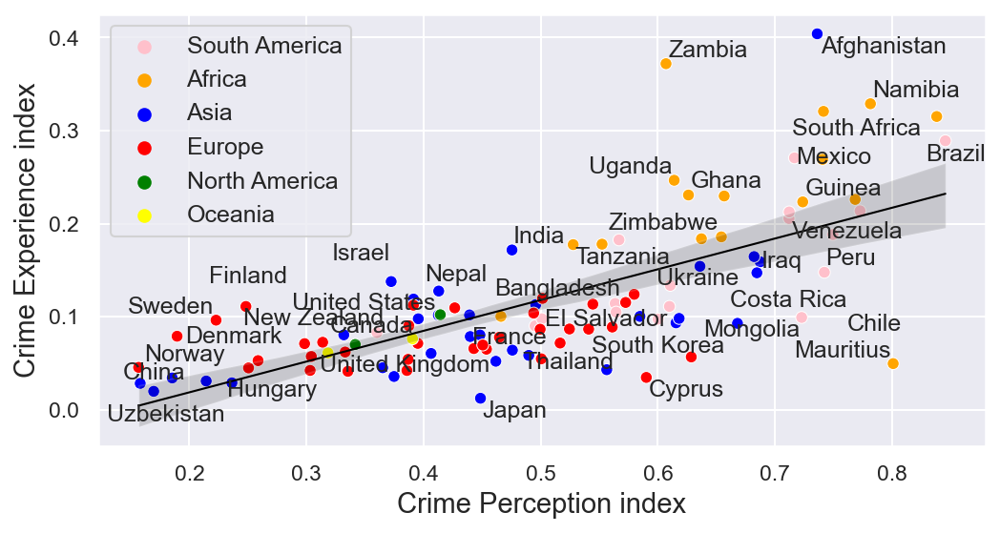

In [72]:

# Set the size of the plot
fig, ax = plt.subplots(figsize=(8, 4), dpi=150)

# Apply the function to create the 'RegionCategory' column
merged_crime['RegionCategory'] = merged_crime['GlobalRegion'].apply(map_region_category)

sns.scatterplot(
    data=merged_crime,
    x='Perception_index_crime',
    y='experience_index_crime',
    hue='RegionCategory',
    palette=color_palette
)

# Add a regression line
sns.regplot(
    data=merged_crime,
    x='Perception_index_crime',
    y='experience_index_crime',
    scatter=False,  # Set to False to avoid plotting data points again
    color='black',  # Set the color of the regression line
    line_kws={"linewidth": 1}  # Set the line width of the regression line
)

countries_to_label = ['United Kingdom','Guinea','Japan','Zimbabwe','Venezuela','Namibia','Thailand','France','New Zealand','United States','China','Mexico','Israel','Afghanistan','South Africa','Bangladesh','Zambia','Canada','Peru','China','Nepal','Iraq','India','Costa Rica','Mongolia','Hungary','El Salvador','Ghana','France','Finland','Sweden','Denmark','Norway','Israel','India','Afganistan','Mauritius','South Korea','Cyprus','Chile','Brazil','Tanzania','Ukraine','Uzbekistan','Uganda','Venezuela']

#countries_to_label = merged_crime.Country.unique()
# Add country names as labels to the points
texts=[]
for i, row in merged_crime.iterrows():
    if row['Country'] in countries_to_label:
        texts.append(plt.text(row['Perception_index_crime'], row['experience_index_crime'], row['Country'],  fontsize=12))

# Set x and y axis labels
plt.xlabel('Crime Perception index',fontsize=14)
plt.ylabel('Crime Experience index',fontsize=14)
adjust_text(texts, ax=ax,force_text=0.01)

# Move legend outside plot area
plt.legend(loc='upper left', fontsize=12)

# Display the plot

plt.savefig('./Figures/crime_experience_perception.pdf',bbox_inches='tight')
plt.show();

## Step 3.9 Crime impact vs actual

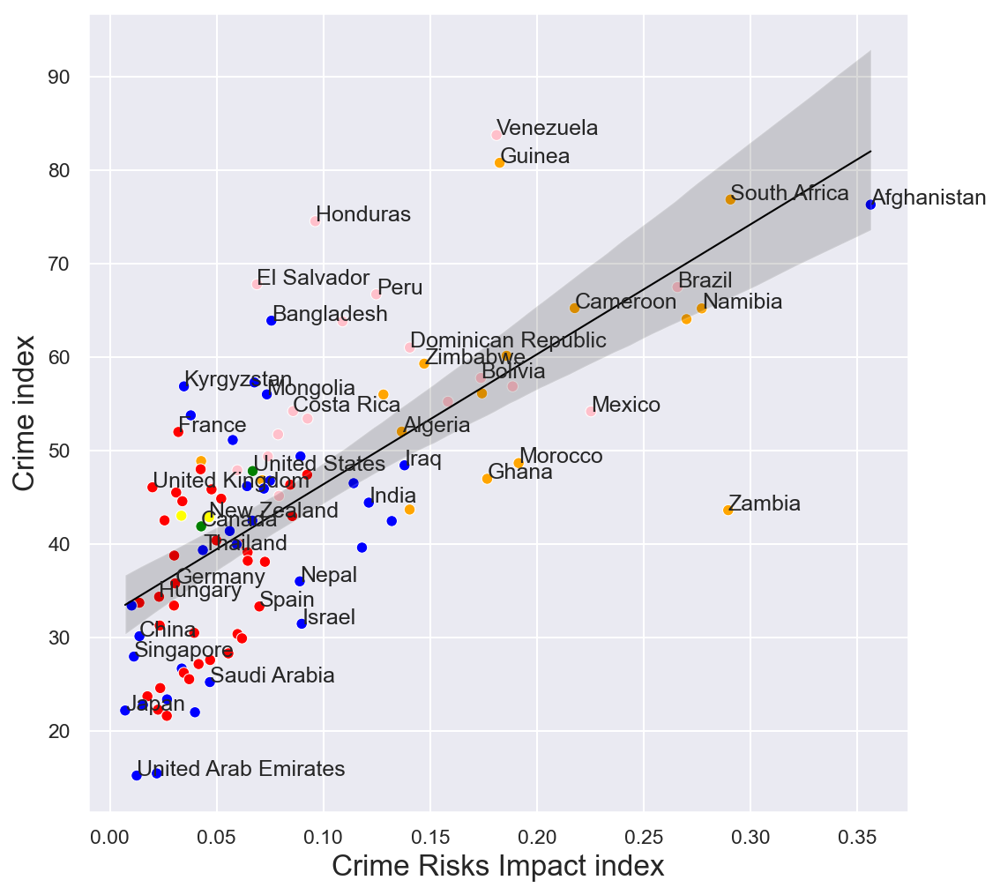

In [73]:
# List of countries to label
countries_to_label = ['United Kingdom','United Arab Emirates','Guinea','Japan','Dominican Republic','Zimbabwe','Venezuela','Saudi Arabia','Namibia','Singapore','Thailand','France','New Zealand','United States','China','Mexico','Honduras','Israel','Afghanistan','South Africa','Bangladesh','Zambia','Canada','Germany','Algeria','Morocco','Bolivia','Peru','China','Nepal','Brazil','Cameroon','Iraq','India','Costa Rica','Mongolia','Hungary','Spain','El Salvador','Kyrgyzstan','Ghana']
#countries_to_label = merged_traffic.Country.unique()

# Create a scatter plot
plt.subplots(figsize=(8, 8), dpi=150)

# Apply the function to create the 'RegionCategory' column
merged_traffic['RegionCategory'] = merged_crime['GlobalRegion'].apply(map_region_category)

g = sns.scatterplot(
    data=merged_crime,
    x='risk_impact_index_crime',
    y='crimeIndex',
    hue=merged_traffic['RegionCategory'],
    palette=color_palette
)

# Add a regression line
sns.regplot(
    data=merged_crime,
    x='risk_impact_index_crime',
    y='crimeIndex',
    scatter=False,  # Set to False to avoid plotting data points again
    color='black',  # Set the color of the regression line
    line_kws={"linewidth": 1}  # Set the line width of the regression line
)

# Add country names as labels to the points
for i, row in merged_crime.iterrows():
    if row['Country'] in countries_to_label:
        plt.text(row['risk_impact_index_crime'], row['crimeIndex'], row['Country'], fontsize=12)

# Set x and y axis labels
plt.xlabel('Crime Risks Impact index', fontsize = 16)
plt.ylabel('Crime index', fontsize=16)
g.get_legend().remove()

# Show all the categories in the legend
#legend_labels = ['Africa', 'North America','South America','Asia', 'Europe','Oceana']
#legend_handles = []
#for label in legend_labels:
#    handle = plt.Line2D([], [], color=color_palette[label], marker='o', markersize=5, label=label)
#    legend_handles.append(handle)

#plt.legend(handles=legend_handles, bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=16)
#plt.legend(  loc='lower right', fontsize=14)


plt.savefig('./Figures/Risks_impact_vs_actual_crime.pdf',bbox_inches='tight')

# Display the plot
plt.show()

## Step 3.10: Mental health and Serious Weather perception vs experience index

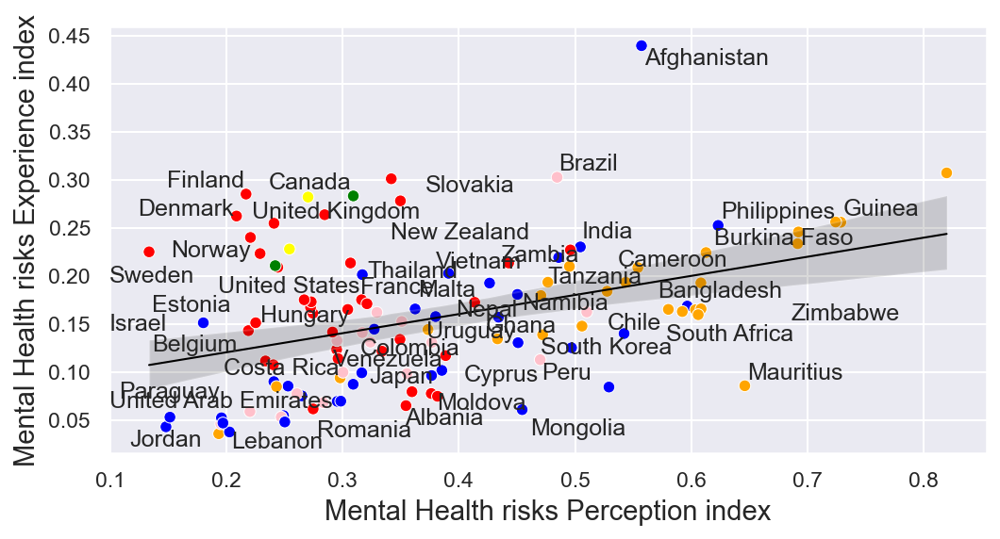

In [74]:
# Set the size of the plot
fig, ax = plt.subplots(figsize=(8, 4), dpi=150)

# Apply the function to create the 'RegionCategory' column
index_scores['RegionCategory'] = index_scores['GlobalRegion'].apply(map_region_category)

sns.scatterplot(
    data=index_scores,
    x='Perception_index_mental_health',
    y='experience_index_mental_health',
    hue='RegionCategory',
    palette=color_palette
)

# Add a regression line
sns.regplot(
    data=index_scores,
    x='Perception_index_mental_health',
    y='experience_index_mental_health',
    scatter=False,  # Set to False to avoid plotting data points again
    color='black',  # Set the color of the regression line
    line_kws={"linewidth": 1}  # Set the line width of the regression line
)

countries_to_label = ['United Kingdom','Malta','Jordan','Lebanon','Romania','Paraguay','Burkina Faso','Vietnam','Cameroon','Uruguay','Estonia','Belgium','Philippines','Peru','Cyprus','Albania','Moldova','United Arab Emirates','Guinea','Japan','Zimbabwe','Venezuela','Namibia','Thailand','France','New Zealand','United States','Israel','Afghanistan','South Africa','Bangladesh','Zambia','Canada','Peru','Nepal','India','Costa Rica','Mongolia','Hungary','Ghana','France','Finland','Sweden','Denmark','Norway','Israel','India','Afganistan','Mauritius','South Korea','Cyprus','Chile','Brazil','Tanzania','Slovakia','Venezuela','Colombia']
#countries_to_label = merged_crime.Country.unique()
# Add country names as labels to the points
texts=[]
for i, row in index_scores.iterrows():
    if row['Country'] in countries_to_label:
        texts.append(plt.text(row['Perception_index_mental_health'], row['experience_index_mental_health'], row['Country'],  fontsize=12))

# Set x and y axis labels
plt.xlabel('Mental Health risks Perception index',fontsize=14)
plt.ylabel('Mental Health risks Experience index',fontsize=14)
adjust_text(texts, ax=ax,force_text=0.015)
# Move legend outside plot area
#plt.legend(loc='upper left', fontsize=12)
plt.legend('', frameon=False)

# Display the plot

plt.savefig('./Figures/mental_health_experience_perception.pdf',bbox_inches='tight')
plt.show();

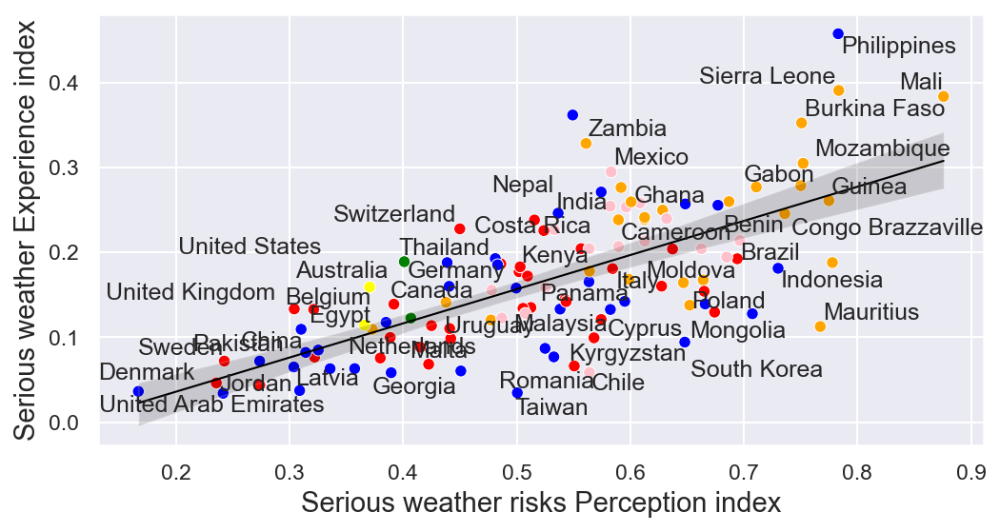

In [75]:
# Set the size of the plot
fig, ax = plt.subplots(figsize=(8, 4), dpi=150)

# Apply the function to create the 'RegionCategory' column
#index_scores['RegionCategory'] = index_scores['GlobalRegion'].apply(map_region_category)

sns.scatterplot(
    data=index_scores,
    x='Perception_index_weather',
    y='experience_index_weather',
    hue='RegionCategory',
    palette=color_palette
)

# Add a regression line
sns.regplot(
    data=index_scores,
    x='Perception_index_weather',
    y='experience_index_weather',
    scatter=False,  # Set to False to avoid plotting data points again
    color='black',  # Set the color of the regression line
    line_kws={"linewidth": 1}  # Set the line width of the regression line
)

countries_to_label = ['United States','United Arab Emirates','Panama','Latvia','Thailand','Kenya','Cameroon','Ecuado','Denmark','Taiwan','Chile','Romania','Sweden','Pakistan','Malta','Georgia','Jordan','Netherlands','Cyprus','China','Egypt','United Kingdom','Belgium','Australia','Canada','South Korea','Mauritius','Uruguay','Malaysia','Poland','Kyrgyzstan','Mongolia','Italy','Panama','Sovenia','Germany','Philippines','Afganistan','Zambia','Mexico','India','Sierra Leone','Mali','Burkina Faso','Zambia','Mozambique','Gabon','Guinea','Congo Brazzaville','Nepal','Switzerland','Brazil','Moldova','Indonesia','Costa Rica','Ghana','Benin']
#countries_to_label = index_scores.Country.unique()
# Add country names as labels to the points
texts=[]
for i, row in index_scores.iterrows():
    if row['Country'] in countries_to_label:
        texts.append(plt.text(row['Perception_index_weather'], row['experience_index_weather'], row['Country'],  fontsize=12))

# Set x and y axis labels
plt.xlabel('Serious weather risks Perception index',fontsize=14)
plt.ylabel('Serious weather Experience index',fontsize=14)
adjust_text(texts, ax=ax,force_text=0.015)
# Move legend outside plot area
#plt.legend(loc='upper left', fontsize=14)
plt.legend('', frameon=False)
# Display the plot

plt.savefig('./Figures/weather_experience_perception.pdf',bbox_inches='tight')
plt.show();



## Make a heat map of Risk Impact index for Traffic and Crime

In [76]:
index_scores.head()

,Country,perception_index,experience_index,risk_impact_index,readiness_index,Perception_index_food,Perception_index_water,Perception_index_crime,Perception_index_weather,Perception_index_traffic,...,risk_impact_index_food,risk_impact_index_water,risk_impact_index_crime,risk_impact_index_weather,risk_impact_index_traffic,risk_impact_index_mental_health,risk_impact_index_work,GlobalRegion,resilience_index,RegionCategory
0,Afghanistan,0.504098,0.350008,0.217335,0.341858,0.385155,0.345190,0.736069,0.549231,0.474846,...,0.186173,0.175805,0.356339,0.255847,0.207132,0.342541,0.152985,South Asia,0.074298,Asia
1,Albania,0.466912,0.066757,0.041336,0.239796,0.556056,0.494494,0.385743,0.415075,0.650505,...,0.059362,0.039653,0.025583,0.062248,0.079833,0.047734,0.027612,Southern Europe,0.009912,Europe
2,Algeria,0.417045,0.179415,0.086729,0.375000,0.310521,0.324695,0.637205,0.477273,0.517116,...,0.126156,0.094584,0.136694,0.074395,0.200052,0.049208,0.084452,North Africa,0.032523,Africa
3,Argentina,0.461948,0.152959,0.085949,0.567368,0.413741,0.410410,0.610611,0.533033,0.597793,...,0.053860,0.081456,0.108952,0.161949,0.145457,0.087212,0.067838,Latin America & Caribbean,0.048765,South America
4,Armenia,0.322071,0.090433,0.039543,0.574682,0.456609,0.273092,0.236298,0.357287,0.405961,...,0.091223,0.047980,0.015479,0.040265,0.101498,0.052810,0.033333,Central Asia,0.022725,Asia


In [77]:
merged_first.head()

,Country,geometry,globalregion_category
0,Afghanistan,"POLYGON ((61.27655 35.60725, 61.29638 35.62854...",South Asia
1,Albania,"POLYGON ((19.57083 41.68527, 19.58195 41.69569...",Southern Europe
2,Algeria,"POLYGON ((4.60335 36.88791, 4.63555 36.88638, ...",North Africa
3,Argentina,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806...",Latin America & Caribbean
4,Armenia,"MULTIPOLYGON (((46.54037 38.87559, 46.51639 38...",Central Asia


In [78]:
risk_index_merged = merged_first.merge(index_scores, on='Country', how='inner')
risk_index_merged.head()

,Country,geometry,globalregion_category,perception_index,experience_index,risk_impact_index,readiness_index,Perception_index_food,Perception_index_water,Perception_index_crime,...,risk_impact_index_food,risk_impact_index_water,risk_impact_index_crime,risk_impact_index_weather,risk_impact_index_traffic,risk_impact_index_mental_health,risk_impact_index_work,GlobalRegion,resilience_index,RegionCategory
0,Afghanistan,"POLYGON ((61.27655 35.60725, 61.29638 35.62854...",South Asia,0.504098,0.350008,0.217335,0.341858,0.385155,0.345190,0.736069,...,0.186173,0.175805,0.356339,0.255847,0.207132,0.342541,0.152985,South Asia,0.074298,Asia
1,Albania,"POLYGON ((19.57083 41.68527, 19.58195 41.69569...",Southern Europe,0.466912,0.066757,0.041336,0.239796,0.556056,0.494494,0.385743,...,0.059362,0.039653,0.025583,0.062248,0.079833,0.047734,0.027612,Southern Europe,0.009912,Europe
2,Algeria,"POLYGON ((4.60335 36.88791, 4.63555 36.88638, ...",North Africa,0.417045,0.179415,0.086729,0.375000,0.310521,0.324695,0.637205,...,0.126156,0.094584,0.136694,0.074395,0.200052,0.049208,0.084452,North Africa,0.032523,Africa
3,Argentina,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806...",Latin America & Caribbean,0.461948,0.152959,0.085949,0.567368,0.413741,0.410410,0.610611,...,0.053860,0.081456,0.108952,0.161949,0.145457,0.087212,0.067838,Latin America & Caribbean,0.048765,South America
4,Armenia,"MULTIPOLYGON (((46.54037 38.87559, 46.51639 38...",Central Asia,0.322071,0.090433,0.039543,0.574682,0.456609,0.273092,0.236298,...,0.091223,0.047980,0.015479,0.040265,0.101498,0.052810,0.033333,Central Asia,0.022725,Asia


In [79]:
import matplotlib as mpl


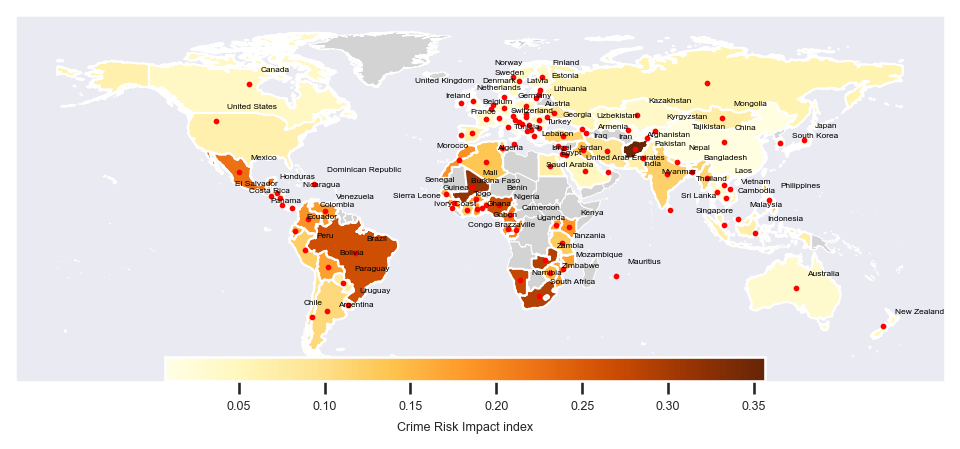

In [80]:
cmap = mpl.cm.YlOrBr
# Set the size of the plot
fig, ax = plt.subplots(figsize=(8, 8), dpi=150)

# Plot the base map in grey color
regions.plot(ax=ax, facecolor='lightgrey', edgecolor='white', linewidth=0.5)

# Remove grids
ax.grid(False)

# Risk frequency
risk_plot = risk_index_merged.plot(ax=ax, column='risk_impact_index_crime', cmap=cmap, legend=False)

# Create a colorbar within the main graph and make it horizontal
norm = plt.Normalize(risk_index_merged['risk_impact_index_crime'].min(), risk_index_merged['risk_impact_index_crime'].max())
cbar_ax = fig.add_axes([0.25, 0.35, 0.5, 0.02])  # Adjust the position and size of the colorbar
cbar = mcb.ColorbarBase(cbar_ax, cmap=cmap, norm=norm, orientation='horizontal')
cbar.ax.set_xlabel('Crime Risk Impact index',fontsize = 6)
cbar.ax.tick_params(labelsize=6)

# Add markers and store annotations in a list
texts = []
for idx, row in risk_index_merged.iterrows():
    ax.scatter(row.geometry.centroid.x, row.geometry.centroid.y, s=3, color='red')
    if (row['globalregion_category'] != 'Eastern Europe') &  (row['globalregion_category'] != 'Southern Europe') :
        texts.append(ax.annotate(row['Country'], xy=(row.geometry.centroid.x, row.geometry.centroid.y), xytext=(5, 5), textcoords='offset points', fontsize=4, color='black'))

# Optimize annotation positions to minimize overlaps
adjust_text(texts, ax=ax,force_text=0.05)

# Hide the x-axis and y-axis ticks and labels
ax.set_xticks([])
ax.set_yticks([])
#plt.tight_layout()
plt.savefig('./Figures/risk_impact_crime_map.pdf')
# Show the plot
plt.show()

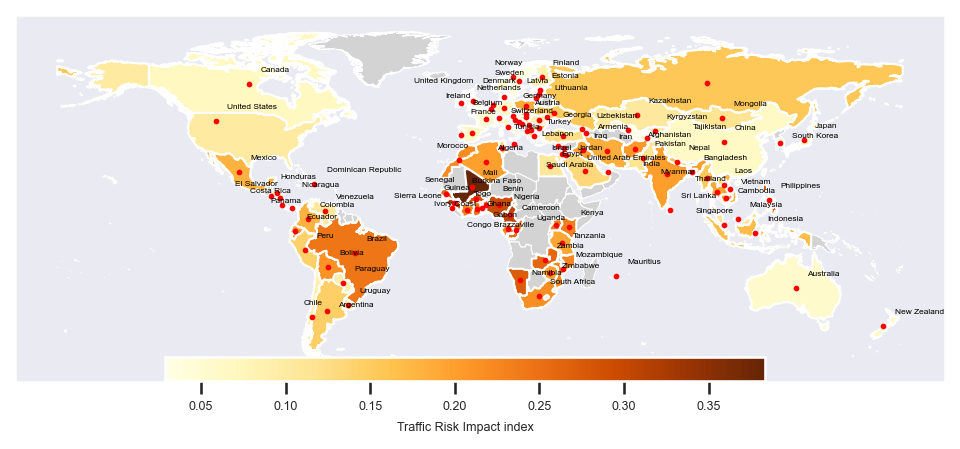

In [81]:
cmap = mpl.cm.YlOrBr
# Set the size of the plot
fig, ax = plt.subplots(figsize=(8, 8), dpi=150)

# Plot the base map in grey color
regions.plot(ax=ax, facecolor='lightgrey', edgecolor='white', linewidth=0.5)

# Remove grids
ax.grid(False)

# Risk frequency
risk_plot = risk_index_merged.plot(ax=ax, column='risk_impact_index_traffic', cmap=cmap, legend=False)

# Create a colorbar within the main graph and make it horizontal
norm = plt.Normalize(risk_index_merged['risk_impact_index_traffic'].min(), risk_index_merged['risk_impact_index_traffic'].max())
cbar_ax = fig.add_axes([0.25, 0.35, 0.5, 0.02])  # Adjust the position and size of the colorbar
cbar = mcb.ColorbarBase(cbar_ax, cmap=cmap, norm=norm, orientation='horizontal')
cbar.ax.set_xlabel('Traffic Risk Impact index',fontsize = 6)
cbar.ax.tick_params(labelsize=6)

# Add markers and store annotations in a list
texts = []
for idx, row in risk_index_merged.iterrows():
    ax.scatter(row.geometry.centroid.x, row.geometry.centroid.y, s=3, color='red')
    if (row['globalregion_category'] != 'Eastern Europe') &  (row['globalregion_category'] != 'Southern Europe') :
        texts.append(ax.annotate(row['Country'], xy=(row.geometry.centroid.x, row.geometry.centroid.y), xytext=(5, 5), textcoords='offset points', fontsize=4, color='black'))

# Optimize annotation positions to minimize overlaps
adjust_text(texts, ax=ax,force_text=0.02)

# Hide the x-axis and y-axis ticks and labels
ax.set_xticks([])
ax.set_yticks([])
#plt.tight_layout()
plt.savefig('./Figures/risk_impact_traffic_map.pdf')
# Show the plot
plt.show()

# Step 4: Comparison of overall risk perception, impact and resilient index with population statistical data

In [82]:
df_pop = pd.read_csv("./shapefiles/population.csv")
df_pop.head()

,"Region, subregion, country or area *",Year,Total Population (thousands),Population Density (persons per square km)
0,WORLD,1950.0,2 499 322,19.2
1,WORLD,1951.0,2 543 130,19.5
2,WORLD,1952.0,2 590 271,19.9
3,WORLD,1953.0,2 640 279,20.2
4,WORLD,1954.0,2 691 979,20.6


In [83]:
df_pop_2021 = df_pop[df_pop['Year'] == 2021]
df_pop_2021 = df_pop_2021.rename(columns={'Region, subregion, country or area *': 'Country'}) 
df_pop_2021 = df_pop_2021.drop(['Year','Total Population (thousands)'], axis=1)
df_pop_2021.head()

,Country,Population Density (persons per square km)
71,WORLD,60.7
144,Sub-Saharan Africa,52.0
216,Northern Africa and Western Asia,43.7
288,Central and Southern Asia,199.9
360,Eastern and South-Eastern Asia,144.1


In [84]:
#converting into numeric values
df_pop_2021['Population Density (persons per square km)'] = pd.to_numeric(df_pop_2021['Population Density (persons per square km)'], errors='coerce')
df_pop_2021.head()

,Country,Population Density (persons per square km)
71,WORLD,60.7
144,Sub-Saharan Africa,52.0
216,Northern Africa and Western Asia,43.7
288,Central and Southern Asia,199.9
360,Eastern and South-Eastern Asia,144.1


In [85]:
df_pop_2021['Country'] = df_pop_2021['Country'].replace('Bolivia (Plurinational State of)', 'Bolivia')
df_pop_2021['Country'] = df_pop_2021['Country'].replace('Bosnia and Herzegovina', 'Bosnia Herzegovina')
df_pop_2021['Country'] = df_pop_2021['Country'].replace('Congo', 'Congo Brazzaville')
df_pop_2021['Country'] = df_pop_2021['Country'].replace('Czechia', 'Czech Republic')
df_pop_2021['Country'] = df_pop_2021['Country'].replace('Iran (Islamic Republic of)', 'Iran')
df_pop_2021['Country'] = df_pop_2021['Country'].replace("Côte d'Ivoire", 'Ivory Coast')
df_pop_2021['Country'] = df_pop_2021['Country'].replace("Lao People's Democratic Republic", 'Laos')
df_pop_2021['Country'] = df_pop_2021['Country'].replace('Republic of Moldova', 'Moldova')
df_pop_2021['Country'] = df_pop_2021['Country'].replace('Russian Federation', 'Russia')
df_pop_2021['Country'] = df_pop_2021['Country'].replace('Republic of Korea', 'South Korea')
df_pop_2021['Country'] = df_pop_2021['Country'].replace('United Republic of Tanzania', 'Tanzania')
df_pop_2021['Country'] = df_pop_2021['Country'].replace('Türkiye', 'Turkey')
df_pop_2021['Country'] = df_pop_2021['Country'].replace('United Kingdom of Great Britain and Northern Ireland', 'United Kingdom')
df_pop_2021['Country'] = df_pop_2021['Country'].replace('United States of America', 'United States')
df_pop_2021['Country'] = df_pop_2021['Country'].replace('Venezuela (Bolivarian Republic of)', 'Venezuela')
df_pop_2021['Country'] = df_pop_2021['Country'].replace('Viet Nam', 'Vietnam')

In [86]:
merged_pop = df_pop_2021.merge(index_scores, on='Country', how='inner')
merged_pop.head()

,Country,Population Density (persons per square km),perception_index,experience_index,risk_impact_index,readiness_index,Perception_index_food,Perception_index_water,Perception_index_crime,Perception_index_weather,...,risk_impact_index_food,risk_impact_index_water,risk_impact_index_crime,risk_impact_index_weather,risk_impact_index_traffic,risk_impact_index_mental_health,risk_impact_index_work,GlobalRegion,resilience_index,RegionCategory
0,Kenya,91.3,0.550674,0.225890,0.147029,0.450754,0.486500,0.449651,0.656627,0.564000,...,0.135870,0.149448,0.185790,0.135617,0.234944,0.129289,0.166845,Eastern Africa,0.066274,Africa
1,Mauritius,639.9,0.598781,0.090805,0.061365,0.804954,0.403749,0.257360,0.800916,0.767241,...,0.045256,0.019750,0.042733,0.096713,0.127411,0.066259,0.072767,Eastern Africa,0.049396,Africa
2,Mozambique,40.8,0.704409,0.259018,0.198115,0.596070,0.720226,0.593909,0.681967,0.752160,...,0.238552,0.176579,0.172565,0.263672,0.227298,0.213913,0.213046,Eastern Africa,0.118090,Africa
3,Uganda,229.5,0.524804,0.242063,0.144261,0.439716,0.409228,0.404810,0.613956,0.612563,...,0.120599,0.137814,0.174269,0.189451,0.238705,0.112206,0.145592,Eastern Africa,0.063434,Africa
4,Tanzania,71.8,0.480851,0.168458,0.097924,0.507708,0.243927,0.381168,0.527692,0.598684,...,0.041667,0.105183,0.128106,0.131994,0.192464,0.135093,0.079215,Eastern Africa,0.049717,Africa


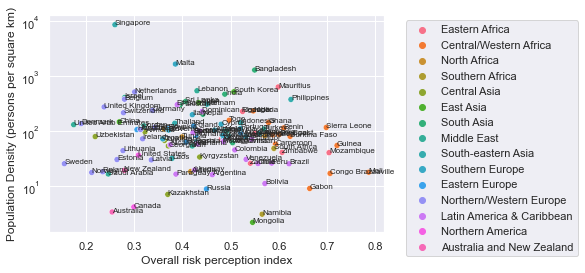

In [87]:
# Create a scatter plot
sns.scatterplot(data=merged_pop, x='perception_index', y='Population Density (persons per square km)', hue='GlobalRegion')

# Add country names as labels to the points
for i, row in merged_pop.iterrows():
    plt.text(row['perception_index'], row['Population Density (persons per square km)'], row['Country'],  fontsize=8)

# Set x and y axis labels
plt.xlabel('Overall risk perception index')
plt.ylabel('Population Density (persons per square km)')
# set y-axis to log scale
plt.yscale('log') 

# Move legend outside plot area
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Display the plot
plt.show();

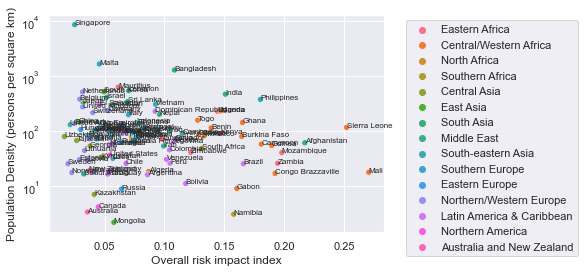

In [88]:
# Create a scatter plot
sns.scatterplot(data=merged_pop, x='risk_impact_index', y='Population Density (persons per square km)', hue='GlobalRegion')

# Add country names as labels to the points
for i, row in merged_pop.iterrows():
    plt.text(row['risk_impact_index'], row['Population Density (persons per square km)'], row['Country'],  fontsize=8)

# Set x and y axis labels
plt.xlabel('Overall risk impact index')
plt.ylabel('Population Density (persons per square km)')
# set y-axis to log scale
plt.yscale('log') 

# Move legend outside plot area
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Display the plot
plt.show();

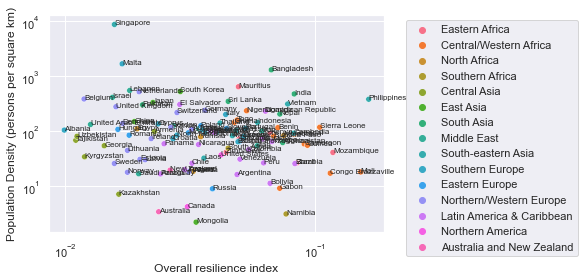

In [89]:
# Create a scatter plot
sns.scatterplot(data=merged_pop, x='resilience_index', y='Population Density (persons per square km)', hue='GlobalRegion')

# Add country names as labels to the points
for i, row in merged_pop.iterrows():
    plt.text(row['resilience_index'], row['Population Density (persons per square km)'], row['Country'],  fontsize=8)

# Set x and y axis labels
plt.xlabel('Overall resilience index')
plt.ylabel('Population Density (persons per square km)')
# set y-axis to log scale
plt.yscale('log') 
plt.xscale('log') 
# Move legend outside plot area
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Display the plot
plt.show();

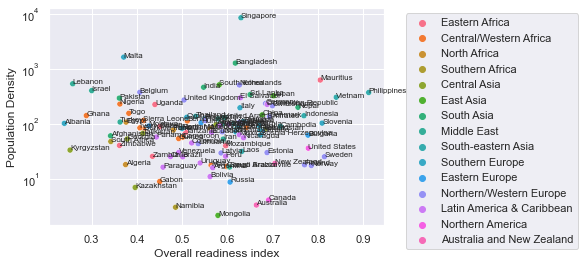

In [90]:
#Graph for the readyness
# Create a scatter plot
sns.scatterplot(data=merged_pop, x='readiness_index', y='Population Density (persons per square km)', hue='GlobalRegion')

# Add country names as labels to the points
for i, row in merged_pop.iterrows():
    plt.text(row['readiness_index'], row['Population Density (persons per square km)'], row['Country'],  fontsize=8)

# Set x and y axis labels
plt.xlabel('Overall readiness index')
plt.ylabel('Population Density')
# set y-axis to log scale
plt.yscale('log') 

# Move legend outside plot area
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Display the plot
plt.show();

## Step 5: New Resilience index


### Step 5.1: Comparison between New Resilience Index vs Risk Impact Index

New_resilience(for country, for individual) = Average of all individual respond to Q20(individual), Q21, Q12 and Q16C (household), Q13 and Q16D(community), and Q16A and Q16B (society)

In [91]:
index_resi=df.loc[:, ['GlobalRegion','Country', 'Q20', 'Q21','Q10Q11Recode','Q16C', 'Q13','Q16D','Q16A','Q16B']]
index_resi.head()

,GlobalRegion,Country,Q20,Q21,Q10Q11Recode,Q16C,Q13,Q16D,Q16A,Q16B
0,6,United States,1.0,1.0,6.0,1.0,1.0,2.0,2.0,1.0
1,6,United States,1.0,1.0,6.0,1.0,1.0,1.0,2.0,1.0
2,6,United States,1.0,1.0,8.0,1.0,2.0,1.0,1.0,1.0
3,6,United States,1.0,2.0,5.0,1.0,1.0,1.0,2.0,1.0
4,6,United States,1.0,1.0,8.0,1.0,2.0,1.0,1.0,1.0


In [92]:
cols_to_replace = ['Q20', 'Q21','Q10Q11Recode','Q16C', 'Q13','Q16D','Q16A','Q16B']
replace_dict = {98: np.nan, 99: np.nan}
index_resi[cols_to_replace] = index_resi[cols_to_replace].replace(replace_dict)
index_resi.head()

,GlobalRegion,Country,Q20,Q21,Q10Q11Recode,Q16C,Q13,Q16D,Q16A,Q16B
0,6,United States,1.0,1.0,6.0,1.0,1.0,2.0,2.0,1.0
1,6,United States,1.0,1.0,6.0,1.0,1.0,1.0,2.0,1.0
2,6,United States,1.0,1.0,8.0,1.0,2.0,1.0,1.0,1.0
3,6,United States,1.0,2.0,5.0,1.0,1.0,1.0,2.0,1.0
4,6,United States,1.0,1.0,8.0,1.0,2.0,1.0,1.0,1.0


In [93]:
# replace the values 2 with 0.5 and 3 with 0
index_resi.loc[:, ['Q13']] = index_resi.loc[:, ['Q13']].replace({2: 0.5, 3: 0})
index_resi.loc[:, ['Q10Q11Recode']] = index_resi.loc[:, ['Q10Q11Recode']].replace({1: 0.1, 2: 0.2, 3: 0.3, 4: 0.4, 5: 0.5, 6: 0.8, 7: 0.9, 8: 1, 9: 0.7})
index_resi.loc[:, ['Q20','Q16D','Q16A','Q16B','Q16C']] = index_resi.loc[:, ['Q20','Q16D','Q16A','Q16B','Q16C']].replace({3: 0.5, 2: 0})
index_resi.loc[:, ['Q21']] = index_resi.loc[:, ['Q21']].replace({2: 0})
index_resi.head()

,GlobalRegion,Country,Q20,Q21,Q10Q11Recode,Q16C,Q13,Q16D,Q16A,Q16B
0,6,United States,1.0,1.0,0.8,1.0,1.0,0.0,0.0,1.0
1,6,United States,1.0,1.0,0.8,1.0,1.0,1.0,0.0,1.0
2,6,United States,1.0,1.0,1.0,1.0,0.5,1.0,1.0,1.0
3,6,United States,1.0,0.0,0.5,1.0,1.0,1.0,0.0,1.0
4,6,United States,1.0,1.0,1.0,1.0,0.5,1.0,1.0,1.0


In [94]:
# define a function to compute the average of the non-ignored values in each row for perception score (worry) and experience score)
def compute_average(row):
    valid_values = [value for value in row if not pd.isna(value)]
    if len(valid_values) > 0:
        return np.mean(valid_values)
    else:
        return np.nan

# create a new column with the computed average
# index['individual_score'] = index.loc[:, []].apply(compute_average, axis=1)
index_resi['household_score'] = index_resi.loc[:, ['Q21','Q10Q11Recode','Q16C']].apply(compute_average, axis=1)
index_resi['community_score'] = index_resi.loc[:, ['Q13', 'Q16D']].apply(compute_average, axis=1)
index_resi['society_score'] = index_resi.loc[:, ['Q16A','Q16B']].apply(compute_average, axis=1)
index_resi.head()

,GlobalRegion,Country,Q20,Q21,Q10Q11Recode,Q16C,Q13,Q16D,Q16A,Q16B,household_score,community_score,society_score
0,6,United States,1.0,1.0,0.8,1.0,1.0,0.0,0.0,1.0,0.933333,0.50,0.5
1,6,United States,1.0,1.0,0.8,1.0,1.0,1.0,0.0,1.0,0.933333,1.00,0.5
2,6,United States,1.0,1.0,1.0,1.0,0.5,1.0,1.0,1.0,1.000000,0.75,1.0
3,6,United States,1.0,0.0,0.5,1.0,1.0,1.0,0.0,1.0,0.500000,1.00,0.5
4,6,United States,1.0,1.0,1.0,1.0,0.5,1.0,1.0,1.0,1.000000,0.75,1.0


In [95]:
# Calculating individual resilience score
index_resi['resilience_score'] = index_resi.loc[:, ['Q20','household_score','community_score','society_score']].apply(compute_average, axis=1)
index_resi.head()

,GlobalRegion,Country,Q20,Q21,Q10Q11Recode,Q16C,Q13,Q16D,Q16A,Q16B,household_score,community_score,society_score,resilience_score
0,6,United States,1.0,1.0,0.8,1.0,1.0,0.0,0.0,1.0,0.933333,0.50,0.5,0.733333
1,6,United States,1.0,1.0,0.8,1.0,1.0,1.0,0.0,1.0,0.933333,1.00,0.5,0.858333
2,6,United States,1.0,1.0,1.0,1.0,0.5,1.0,1.0,1.0,1.000000,0.75,1.0,0.937500
3,6,United States,1.0,0.0,0.5,1.0,1.0,1.0,0.0,1.0,0.500000,1.00,0.5,0.750000
4,6,United States,1.0,1.0,1.0,1.0,0.5,1.0,1.0,1.0,1.000000,0.75,1.0,0.937500


In [130]:
resilience_index = index_resi.groupby('Country').agg({'resilience_score': 'mean'}).reset_index()
resilience_index = resilience_index.rename(columns={'resilience_score': 'resilience_index'})
resilience_index.head()

,Country,resilience_index
0,Afghanistan,0.286347
1,Albania,0.300214
2,Algeria,0.376750
3,Argentina,0.403610
4,Armenia,0.445351


In [129]:
index_scores.head()

,Country,perception_index,experience_index,risk_impact_index,readiness_index,Perception_index_food,Perception_index_water,Perception_index_crime,Perception_index_weather,Perception_index_traffic,...,experience_index_work,risk_impact_index_food,risk_impact_index_water,risk_impact_index_crime,risk_impact_index_weather,risk_impact_index_traffic,risk_impact_index_mental_health,risk_impact_index_work,GlobalRegion,RegionCategory
0,Afghanistan,0.504098,0.350008,0.217335,0.341858,0.385155,0.345190,0.736069,0.549231,0.474846,...,0.323498,0.186173,0.175805,0.356339,0.255847,0.207132,0.342541,0.152985,South Asia,Asia
1,Albania,0.466912,0.066757,0.041336,0.239796,0.556056,0.494494,0.385743,0.415075,0.650505,...,0.042169,0.059362,0.039653,0.025583,0.062248,0.079833,0.047734,0.027612,Southern Europe,Europe
2,Algeria,0.417045,0.179415,0.086729,0.375000,0.310521,0.324695,0.637205,0.477273,0.517116,...,0.123457,0.126156,0.094584,0.136694,0.074395,0.200052,0.049208,0.084452,North Africa,Africa
3,Argentina,0.461948,0.152959,0.085949,0.567368,0.413741,0.410410,0.610611,0.533033,0.597793,...,0.141109,0.053860,0.081456,0.108952,0.161949,0.145457,0.087212,0.067838,Latin America & Caribbean,South America
4,Armenia,0.322071,0.090433,0.039543,0.574682,0.456609,0.273092,0.236298,0.357287,0.405961,...,0.061235,0.091223,0.047980,0.015479,0.040265,0.101498,0.052810,0.033333,Central Asia,Asia


In [128]:
index_scores=index_scores.drop('resilience_index',axis=1)

KeyError: "['resilience_index'] not found in axis"

In [131]:
merged_index = resilience_index.merge(index_scores, on='Country', how='inner')
merged_index.head()

,Country,resilience_index,perception_index,experience_index,risk_impact_index,readiness_index,Perception_index_food,Perception_index_water,Perception_index_crime,Perception_index_weather,...,experience_index_work,risk_impact_index_food,risk_impact_index_water,risk_impact_index_crime,risk_impact_index_weather,risk_impact_index_traffic,risk_impact_index_mental_health,risk_impact_index_work,GlobalRegion,RegionCategory
0,Afghanistan,0.286347,0.504098,0.350008,0.217335,0.341858,0.385155,0.345190,0.736069,0.549231,...,0.323498,0.186173,0.175805,0.356339,0.255847,0.207132,0.342541,0.152985,South Asia,Asia
1,Albania,0.300214,0.466912,0.066757,0.041336,0.239796,0.556056,0.494494,0.385743,0.415075,...,0.042169,0.059362,0.039653,0.025583,0.062248,0.079833,0.047734,0.027612,Southern Europe,Europe
2,Algeria,0.376750,0.417045,0.179415,0.086729,0.375000,0.310521,0.324695,0.637205,0.477273,...,0.123457,0.126156,0.094584,0.136694,0.074395,0.200052,0.049208,0.084452,North Africa,Africa
3,Argentina,0.403610,0.461948,0.152959,0.085949,0.567368,0.413741,0.410410,0.610611,0.533033,...,0.141109,0.053860,0.081456,0.108952,0.161949,0.145457,0.087212,0.067838,Latin America & Caribbean,South America
4,Armenia,0.445351,0.322071,0.090433,0.039543,0.574682,0.456609,0.273092,0.236298,0.357287,...,0.061235,0.091223,0.047980,0.015479,0.040265,0.101498,0.052810,0.033333,Central Asia,Asia


### Step 5.2: Resilience index vs Risk Impact index

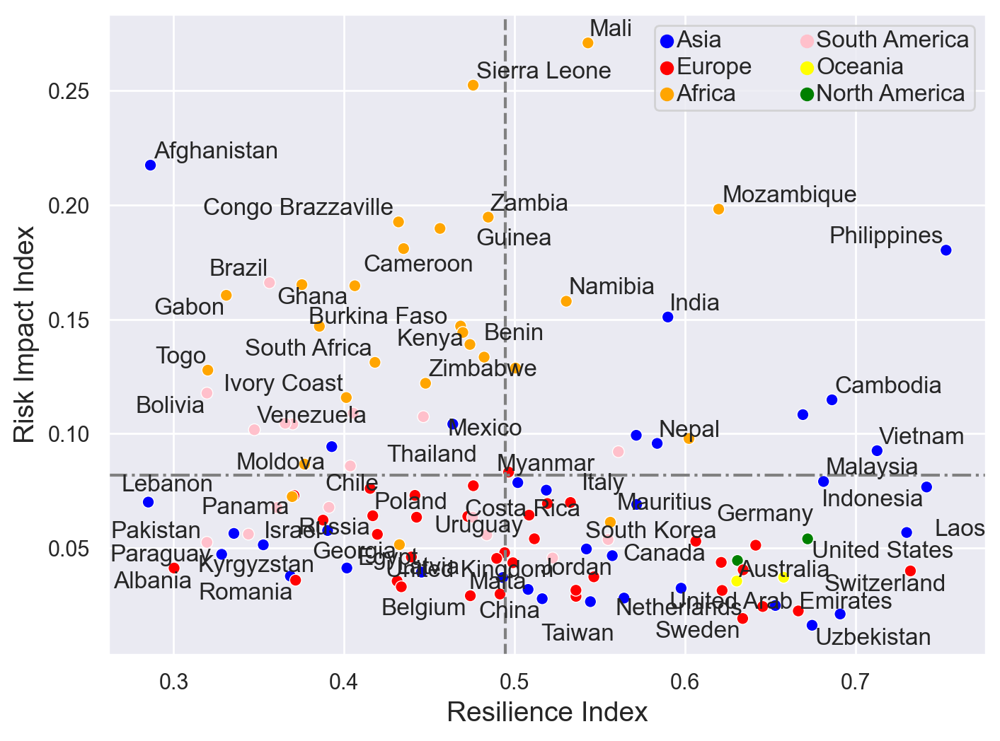

In [100]:
# Create a scatter plot
fig,ax = plt.subplots(figsize=(8, 6), dpi=200)

# Apply the function to create the 'RegionCategory' column
merged_index['RegionCategory'] = merged_index['GlobalRegion'].apply(map_region_category)

sns.scatterplot(
    data=merged_index,
    x='resilience_index',
    y='risk_impact_index',
    hue='RegionCategory',
    palette=color_palette
)

countries_to_label = ['United States','Ghana','Cameroon','Benin','Kenya','Namibia','Zimbabwe','Ivory Coast','South Africa','Guinea','United Arab Emirates','Albania','Panama','Latvia','Thailand','Kenya','Cameroon','Ecuado','Taiwan','Chile','Romania','Sweden','Pakistan','Malta','Georgia','Jordan','Netherlands','China','Egypt','United Kingdom','Belgium','Australia','Canada','South Korea','Mauritius','Uruguay','Russia','Myanmar','Malaysia','Poland','Kyrgyzstan','Italy','Panama','Sovenia','Germany','Philippines','Afganistan','Zambia','Mexico','India','Sierra Leone','Mali','Burkina Faso','Zambia','Mozambique','Gabon','Guinea','Congo Brazzaville','Nepal','Switzerland','Brazil','Moldova','Indonesia','Costa Rica','Ghana','Benin','Afghanistan','Albania','Lebanon','Paraguay','Bolivia','Israel','Kyrgyzstan','Panama','Togo','Venezuela','Vietnam','Laos','Cambodia','Malaysia','Uzbekistan']
#countries_to_label = index_scores.Country.unique()
# Add country names as labels to the points
texts=[]
for i, row in merged_index.iterrows():
    if row['Country'] in countries_to_label:
        texts.append(plt.text(row['resilience_index'], row['risk_impact_index'], row['Country'],  fontsize=12))

# Set x and y axis labels
plt.xlabel('Resilience Index',fontsize=14)
plt.ylabel('Risk Impact Index',fontsize=14)
adjust_text(texts,ax=ax,force_text=0.01)
#add mean lines
plt.axhline(merged_index['risk_impact_index'].mean(), linestyle='-.', color='gray')
plt.axvline(merged_index['resilience_index'].mean(), linestyle='--', color='gray')


# Move legend outside plot area
# Customize the legend
plt.legend(loc='upper right',
           fontsize=12,
           ncol=2,
           #bbox_to_anchor=(0, 1.05),
           borderpad=0.2,     # Padding around the border of the legend
           labelspacing=0.2,  # Spacing between the labels
           handletextpad=0.1, # Spacing between the handle and the label
           handlelength=0.6     # Length of the handle
          )

# Display the plot

plt.savefig('./Figures/Resilience_risk_index.pdf',bbox_inches='tight')
plt.show();

### Step 5.3. Let's rank the countries using their resilience index

In [135]:
merged_index = merged_first.merge(resilience_index, on='Country', how='inner')


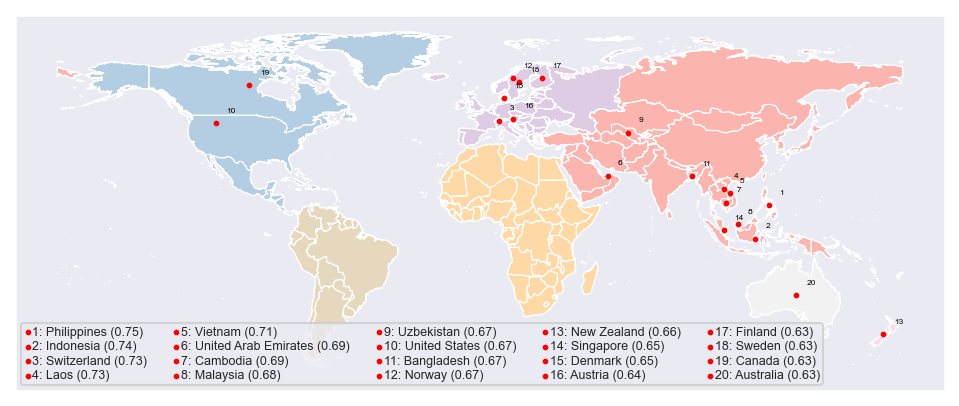

In [144]:
# Set the size of the plot
fig, ax = plt.subplots(figsize=(8, 4), dpi=150)

lands.plot(ax=ax, cmap='Pastel1', edgecolor='white', linewidth=0.5)
# Plot the base map in grey color
regions.plot(ax=ax,facecolor='none', edgecolor='white', linewidth=0.5)

# Plot the merged_first map on top of the base map
merged_index['resilience_index_formatted'] = merged_index['resilience_index'].apply(lambda x: "{:.2f}".format(x))
merged_index.loc[:,'Rank'] = merged_index['resilience_index'].rank(ascending=False)
merged_index_ranked = merged_index[merged_index['Rank']<21].copy()

# add markers
for idx, row in merged_index_ranked.iterrows():
    plt.scatter(row.geometry.centroid.x, row.geometry.centroid.y, s=3, color='red')
    plt.annotate(f"{int(row['Rank'])}", xy=(row.geometry.centroid.x, row.geometry.centroid.y), xytext=(5, 5), textcoords='offset points', fontsize=4, color='black')
    
# Create a list of strings for the legend
merged_index_ranked = merged_index_ranked.sort_values(by='Rank')
legend_labels = [f'{int(row["Rank"])}: {row["Country"]} ({row["resilience_index_formatted"]})' for _, row in merged_index_ranked.iterrows()]
#plt.legend(legend_labels, loc='upper left', fontsize=6,ncol=5)

# Customize the legend
plt.legend(legend_labels,
           loc='lower left',
           fontsize=6,
           ncol=5,
           #bbox_to_anchor=(0, 1.05),
           borderpad=0.2,     # Padding around the border of the legend
           labelspacing=0.2,  # Spacing between the labels
           handletextpad=0.1, # Spacing between the handle and the label
           handlelength=0.6     # Length of the handle
          )

# Hide the x-axis and y-axis ticks and labels
ax.set_xticks([])
ax.set_yticks([])
plt.savefig('./Figures/resilience_index_rank_map_top.pdf',bbox_inches='tight')
# show the plot
plt.show();

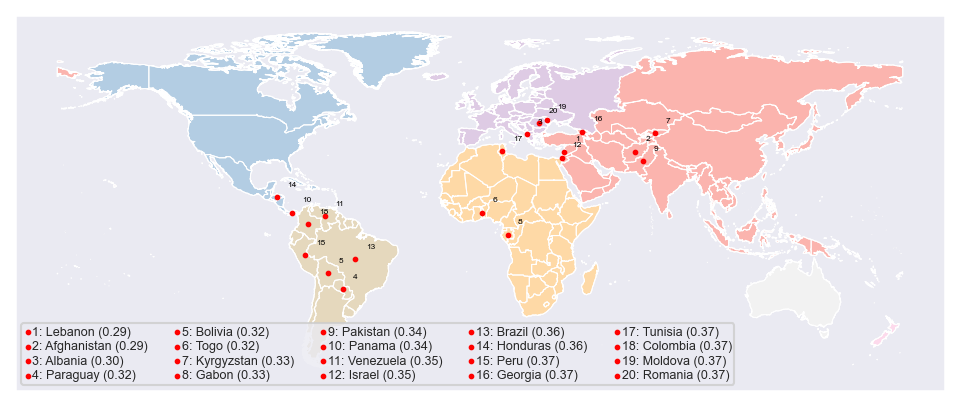

In [142]:
# Set the size of the plot
fig, ax = plt.subplots(figsize=(8, 4), dpi=150)

lands.plot(ax=ax, cmap='Pastel1', edgecolor='white', linewidth=0.5)
# Plot the base map in grey color
regions.plot(ax=ax,facecolor='none', edgecolor='white', linewidth=0.5)

# Plot the merged_first map on top of the base map
merged_index['resilience_index_formatted'] = merged_index['resilience_index'].apply(lambda x: "{:.2f}".format(x))
merged_index.loc[:,'Rank'] = merged_index['resilience_index'].rank(ascending=True)
merged_index_ranked = merged_index[merged_index['Rank']<21].copy()

# add markers
for idx, row in merged_index_ranked.iterrows():
    plt.scatter(row.geometry.centroid.x, row.geometry.centroid.y, s=3, color='red')
    plt.annotate(f"{int(row['Rank'])}", xy=(row.geometry.centroid.x, row.geometry.centroid.y), xytext=(5, 5), textcoords='offset points', fontsize=4, color='black')
    
# Create a list of strings for the legend
merged_index_ranked = merged_index_ranked.sort_values(by='Rank')
legend_labels = [f'{int(row["Rank"])}: {row["Country"]} ({row["resilience_index_formatted"]})' for _, row in merged_index_ranked.iterrows()]
#plt.legend(legend_labels, loc='upper left', fontsize=6,ncol=5)

# Customize the legend
plt.legend(legend_labels,
           loc='lower left',
           fontsize=6,
           ncol=5,
           #bbox_to_anchor=(0, 1.05),
           borderpad=0.2,     # Padding around the border of the legend
           labelspacing=0.2,  # Spacing between the labels
           handletextpad=0.1, # Spacing between the handle and the label
           handlelength=0.6     # Length of the handle
          )

# Hide the x-axis and y-axis ticks and labels
ax.set_xticks([])
ax.set_yticks([])
plt.savefig('./Figures/resilience_index_rank_map_bottom.pdf',bbox_inches='tight')
# show the plot
plt.show();

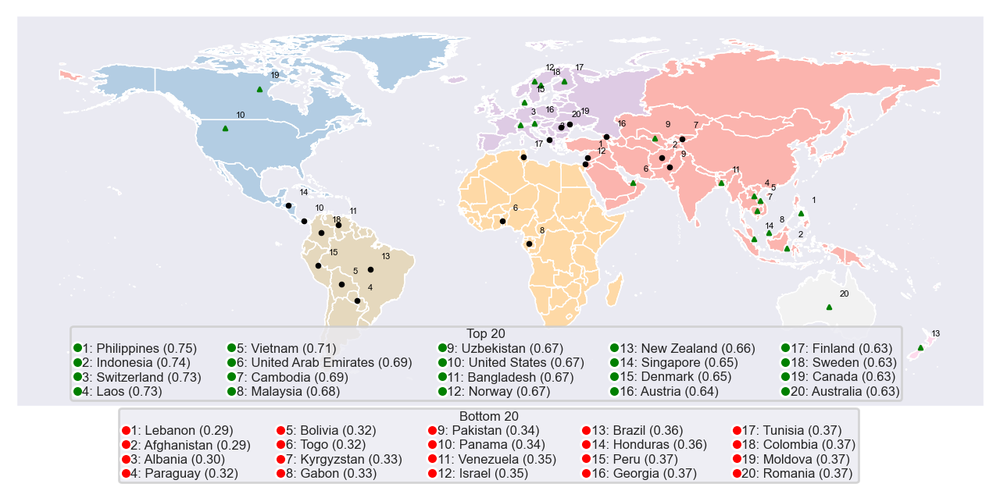

In [165]:
# Set the size of the plot
fig, ax = plt.subplots(figsize=(8, 4), dpi=200)

lands.plot(ax=ax, cmap='Pastel1', edgecolor='white', linewidth=0.5)
# Plot the base map in grey color
regions.plot(ax=ax,facecolor='none', edgecolor='white', linewidth=0.5)

# Plot the merged_first map on top of the base map
merged_index['resilience_index_formatted'] = merged_index['resilience_index'].apply(lambda x: "{:.2f}".format(x))
merged_index.loc[:,'Rank'] = merged_index['resilience_index'].rank(ascending=False)
merged_index_ranked = merged_index[merged_index['Rank']<21].copy()

# add markers
for idx, row in merged_index_ranked.iterrows():
    plt.scatter(row.geometry.centroid.x, row.geometry.centroid.y, s=3, color='green', marker = "^")
    plt.annotate(f"{int(row['Rank'])}", xy=(row.geometry.centroid.x, row.geometry.centroid.y), xytext=(5, 5), textcoords='offset points', fontsize=4, color='black')
    
# Create a list of strings for the legend
merged_index_ranked = merged_index_ranked.sort_values(by='Rank')
legend_labels1 = [f'{int(row["Rank"])}: {row["Country"]} ({row["resilience_index_formatted"]})' for _, row in merged_index_ranked.iterrows()]

# Plot the merged_first map on top of the base map
merged_index['resilience_index_formatted'] = merged_index['resilience_index'].apply(lambda x: "{:.2f}".format(x))
merged_index.loc[:,'Rank'] = merged_index['resilience_index'].rank(ascending=True)
merged_index_ranked = merged_index[merged_index['Rank']<21].copy()

# add markers
for idx, row in merged_index_ranked.iterrows():
    plt.scatter(row.geometry.centroid.x, row.geometry.centroid.y, s=3, color='black')
    plt.annotate(f"{int(row['Rank'])}", xy=(row.geometry.centroid.x, row.geometry.centroid.y), xytext=(5, 5), textcoords='offset points', fontsize=4, color='black')
    
# Create a list of strings for the legend
merged_index_ranked = merged_index_ranked.sort_values(by='Rank')
legend_labels2 = [f'{int(row["Rank"])}: {row["Country"]} ({row["resilience_index_formatted"]})' for _, row in merged_index_ranked.iterrows()]

# Create custom legend elements
from matplotlib.lines import Line2D
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=lab,
                          markerfacecolor='green', markersize=5) for lab in legend_labels1]
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=lab,
                          markerfacecolor='red', markersize=5) for lab in legend_labels2]

# Create the first legend and add it manually to the current Axes.
first_legend= ax.legend(handles=legend_elements1, loc='lower left', fontsize=6, ncol=5, bbox_to_anchor=(0.05, 0),
          borderpad=0.2, labelspacing=0.2, handletextpad=0.1, handlelength=0.6, title='Top 20',title_fontsize=6)

plt.gca().add_artist(first_legend)

# Add the second legend
ax.legend(handles=legend_elements2, loc='lower left', fontsize=6, ncol=5, bbox_to_anchor=(0.1, -0.21),
          borderpad=0.2, labelspacing=0.2, handletextpad=0.1, handlelength=0.6, title="Bottom 20",title_fontsize=6)

# Hide the x-axis and y-axis ticks and labels
ax.set_xticks([])
ax.set_yticks([])
plt.savefig('./Figures/resilience_index_rank_map.pdf',bbox_inches='tight')
# show the plot
plt.show();

## Step 6: Peolple experience on natural disasters and country's resilience to disasters

### Step 6.1: Experience with Disasters

In [102]:
disaster_ex=df.loc[:, ['GlobalRegion','Country', 'Q18_1','Q17']]
disaster_ex.head()

,GlobalRegion,Country,Q18_1,Q17
0,6,United States,NaN,2.0
1,6,United States,NaN,2.0
2,6,United States,NaN,2.0
3,6,United States,NaN,2.0
4,6,United States,NaN,2.0


In [103]:
disaster_ex = disaster_ex[(disaster_ex['Q18_1'] != 98) & (disaster_ex['Q18_1'] != 99)]


In [104]:
disaster_map = {
    1: 'Flood/Heavy rain',
    2: 'Hurricane/Cyclone',
    3: 'Tornado',
    4: 'Thunder or lightning storm',
    5: 'Tsunami',
    6: 'Mudslide',
    7: 'Earthquake',
    8: 'Wildfire',
    9: 'Volcano eruption',
    10: 'Blizzard or snowstorm',
    11: 'Other',
    50: 'Drought',
}

# Use the replace method to replace the numbers with the region names
disaster_ex['Q18_1'] = disaster_ex['Q18_1'].replace(disaster_map)
disaster_ex.head()

,GlobalRegion,Country,Q18_1,Q17
0,6,United States,NaN,2.0
1,6,United States,NaN,2.0
2,6,United States,NaN,2.0
3,6,United States,NaN,2.0
4,6,United States,NaN,2.0


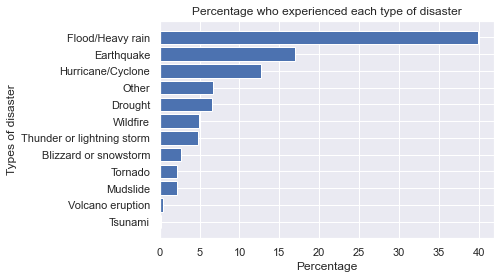

In [105]:
# Group the data by 'Q18_1' and count the occurrences
q18_1_counts = disaster_ex['Q18_1'].value_counts()

# Sort the counts in descending order
q18_1_counts = q18_1_counts.sort_values(ascending=True)

# Calculate the percentage for each type of disaster
total = q18_1_counts.sum()
q18_1_percentages = (q18_1_counts / total) * 100

# Sort the percentages in descending order
q18_1_percentages = q18_1_percentages.sort_values(ascending=True)

# Create a horizontal bar plot
plt.barh(q18_1_percentages.index, q18_1_percentages.values)

# Set the labels and title
plt.xlabel('Percentage')
plt.ylabel('Types of disaster')
plt.title('Percentage who experienced each type of disaster')


plt.savefig('./Figures/Disaster_experience.pdf')

# Display the plot
plt.show()


### Step 6.2 Comparison with disaster statistical data

##### people experience disaster in past 5 yrs vs actual data

In [106]:
df_disaster = pd.read_csv("./shapefiles/disasters.csv")
df_disaster = df_disaster.rename(columns={'Country name': 'Country'}) 
df_disaster.head()

,Country,Year,Death rates from disasters,"Number of people affected by disasters per 100,000"
0,Afghanistan,1900,0.0,0.0
1,Afghanistan,1910,0.0,0.0
2,Afghanistan,1920,0.0,0.0
3,Afghanistan,1930,0.0,0.0
4,Afghanistan,1940,0.0,0.0


In [107]:
df_disaster= df_disaster[df_disaster['Year'].isin([2020])]
df_disaster.head()

,Country,Year,Death rates from disasters,"Number of people affected by disasters per 100,000"
12,Afghanistan,2020,1.700606,9519.594000
25,Africa,2020,0.156916,2562.882600
38,Albania,2020,0.000000,0.980835
51,Algeria,2020,0.110379,50.602490
64,American Samoa,2020,0.000000,0.000000


In [108]:
disaster_ex.head()

,GlobalRegion,Country,Q18_1,Q17
0,6,United States,NaN,2.0
1,6,United States,NaN,2.0
2,6,United States,NaN,2.0
3,6,United States,NaN,2.0
4,6,United States,NaN,2.0


In [109]:
disaster_ex_per = disaster_ex.dropna(subset=['Q17'])
disaster_ex_per.head()

,GlobalRegion,Country,Q18_1,Q17
0,6,United States,NaN,2.0
1,6,United States,NaN,2.0
2,6,United States,NaN,2.0
3,6,United States,NaN,2.0
4,6,United States,NaN,2.0


In [110]:

# Filter the DataFrame for 'Q17' equal to 1
selected_1 = disaster_ex_per[disaster_ex_per['Q17'] == 1]

# Count the occurrences of each country
country_counts = selected_1['Country'].value_counts()

country_counts_all = disaster_ex_per['Country'].value_counts()
# Calculate the percentage for each country
country_percentage = (country_counts /country_counts_all) * 100

# Create a new DataFrame with 'Country' and 'Percentage' columns
df_percentage_ex = pd.DataFrame({'Country': country_percentage.index, 'Percentage_disaster_ex': country_percentage.values})

# Sort the DataFrame by 'Country' column
df_percentage_ex = df_percentage_ex.sort_values(by='Country')

# Reset the index
df_percentage_ex = df_percentage_ex.reset_index(drop=True)

df_percentage_ex.head()

,Country,Percentage_disaster_ex
0,Afghanistan,45.573441
1,Albania,30.730731
2,Algeria,7.615230
3,Argentina,19.980020
4,Armenia,47.887324


In [111]:
merged_disaster = df_disaster.merge(df_percentage_ex, on='Country', how='inner')
merged_disaster.head()

,Country,Year,Death rates from disasters,"Number of people affected by disasters per 100,000",Percentage_disaster_ex
0,Afghanistan,2020,1.700606,9519.594000,45.573441
1,Albania,2020,0.000000,0.980835,30.730731
2,Algeria,2020,0.110379,50.602490,7.615230
3,Argentina,2020,0.013264,95.564514,19.980020
4,Armenia,2020,0.000000,33.694397,47.887324


In [112]:
merged_disaster = merged_disaster.merge(index_region, on='Country', how='inner')
merged_disaster.head()

,Country,Year,Death rates from disasters,"Number of people affected by disasters per 100,000",Percentage_disaster_ex,GlobalRegion
0,Afghanistan,2020,1.700606,9519.594000,45.573441,South Asia
1,Albania,2020,0.000000,0.980835,30.730731,Southern Europe
2,Algeria,2020,0.110379,50.602490,7.615230,North Africa
3,Argentina,2020,0.013264,95.564514,19.980020,Latin America & Caribbean
4,Armenia,2020,0.000000,33.694397,47.887324,Central Asia


In [124]:
merged_disaster_index = merged_disaster.merge(merged_index, on='Country', how='inner')
merged_disaster_index.head()

,Country,Year,Death rates from disasters,"Number of people affected by disasters per 100,000",Percentage_disaster_ex,GlobalRegion_x,resilience_index,perception_index,experience_index,risk_impact_index,...,experience_index_work,risk_impact_index_food,risk_impact_index_water,risk_impact_index_crime,risk_impact_index_weather,risk_impact_index_traffic,risk_impact_index_mental_health,risk_impact_index_work,GlobalRegion_y,RegionCategory
0,Afghanistan,2020,1.700606,9519.594000,45.573441,South Asia,0.286347,0.504098,0.350008,0.217335,...,0.323498,0.186173,0.175805,0.356339,0.255847,0.207132,0.342541,0.152985,South Asia,Asia
1,Albania,2020,0.000000,0.980835,30.730731,Southern Europe,0.300214,0.466912,0.066757,0.041336,...,0.042169,0.059362,0.039653,0.025583,0.062248,0.079833,0.047734,0.027612,Southern Europe,Europe
2,Algeria,2020,0.110379,50.602490,7.615230,North Africa,0.376750,0.417045,0.179415,0.086729,...,0.123457,0.126156,0.094584,0.136694,0.074395,0.200052,0.049208,0.084452,North Africa,Africa
3,Argentina,2020,0.013264,95.564514,19.980020,Latin America & Caribbean,0.403610,0.461948,0.152959,0.085949,...,0.141109,0.053860,0.081456,0.108952,0.161949,0.145457,0.087212,0.067838,Latin America & Caribbean,South America
4,Armenia,2020,0.000000,33.694397,47.887324,Central Asia,0.445351,0.322071,0.090433,0.039543,...,0.061235,0.091223,0.047980,0.015479,0.040265,0.101498,0.052810,0.033333,Central Asia,Asia


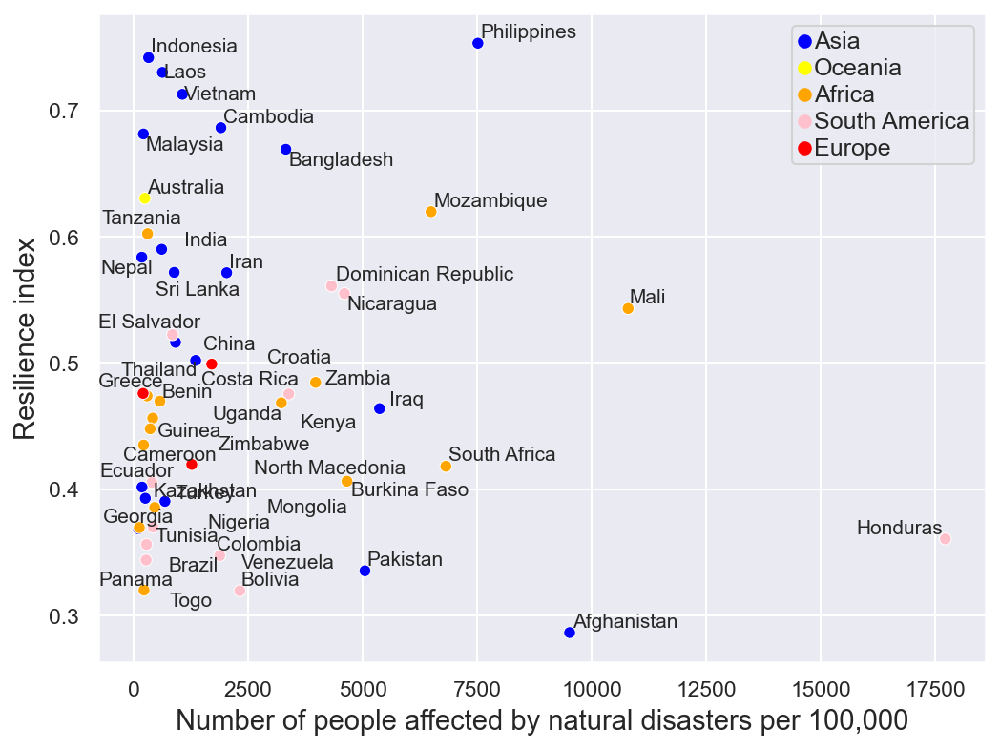

In [127]:
# List of countries to label
#countries_to_label = ['United Kingdom','Afghanistan','Bangladesh','Dominican Republic','Honduras','Iraq','Kenya','Mali','Namibia','Pakistan','Philippines','South Africa','New Zealand','Australia','United States','Ukraine','Burkina Faso','Costa Rica','Zimbabwe','Namibia','Mexico','Hong Kong','Iran','Cambodia','Armenia','Sierra Leone','United Arab Emirates','Mozambique']
# Set the size of the plot
fig, ax = plt.subplots(figsize=(8, 6), dpi=150)

merged_disaster_index2 = merged_disaster_index[merged_disaster_index['Number of people affected by disasters per 100,000']>100]


# Create the linear regression plot
sns.scatterplot(
    data=merged_disaster_index2,
    x='Number of people affected by disasters per 100,000', 
    y='resilience_index', 
    hue='RegionCategory',
    palette=color_palette
)
countries_to_label = merged_disaster_index2.Country.unique()
# Add country names as labels to the points
texts=[]
for i, row in merged_disaster_index2.iterrows():
    if row['Country'] in countries_to_label:
        texts.append(plt.text(row['Number of people affected by disasters per 100,000'], row['resilience_index'], row['Country'], fontsize=10))

# Set x and y axis labels
plt.xlabel('Number of people affected by natural disasters per 100,000',fontsize=14)
plt.ylabel('Resilience index',fontsize=14)
adjust_text(texts,ax=ax,force_text=0.02)

plt.legend(loc='upper right',
           fontsize=12,
           ncol=1,
           #bbox_to_anchor=(0, 1.05),
           borderpad=0.2,     # Padding around the border of the legend
           labelspacing=0.2,  # Spacing between the labels
           handletextpad=0.1, # Spacing between the handle and the label
           handlelength=0.6     # Length of the handle
          )

plt.savefig('./Figures/Resilience_index_vs_actual_disasters.pdf')
# Display the plot
plt.show()


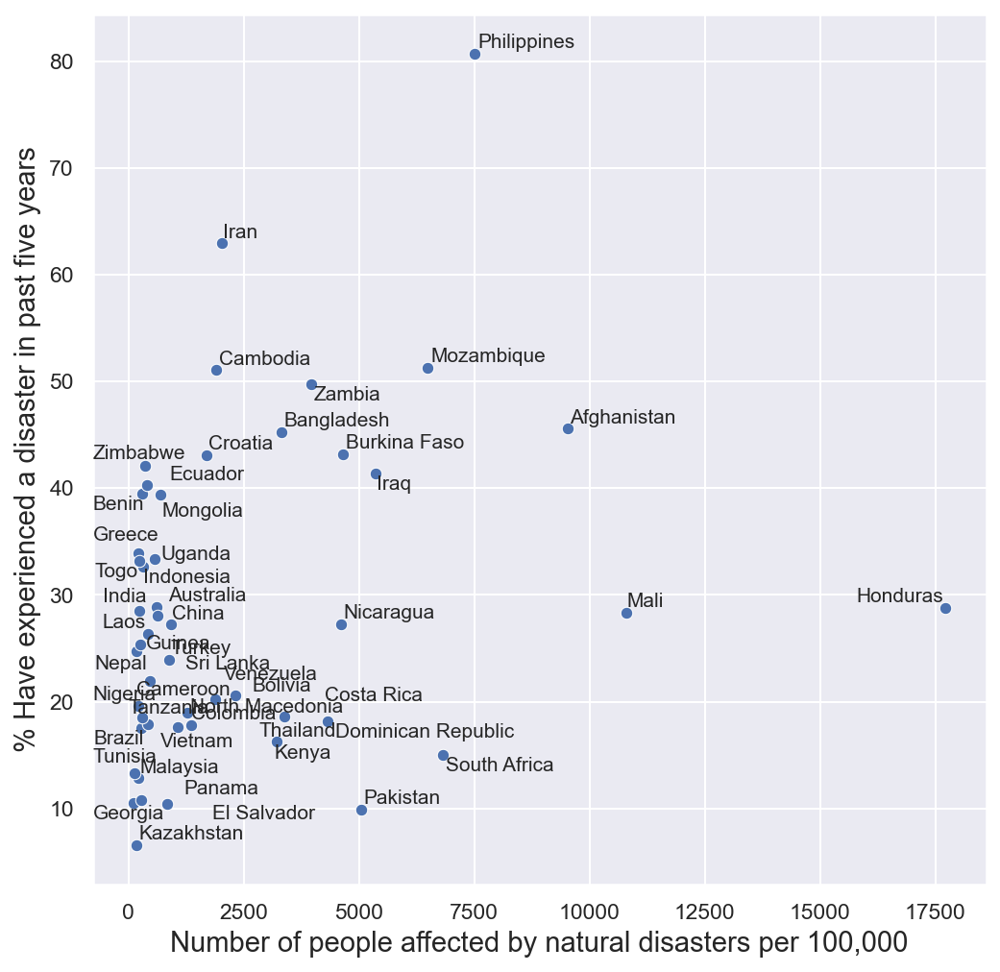

In [123]:
# List of countries to label
#countries_to_label = ['United Kingdom','Afghanistan','Bangladesh','Dominican Republic','Honduras','Iraq','Kenya','Mali','Namibia','Pakistan','Philippines','South Africa','New Zealand','Australia','United States','Ukraine','Burkina Faso','Costa Rica','Zimbabwe','Namibia','Mexico','Hong Kong','Iran','Cambodia','Armenia','Sierra Leone','United Arab Emirates','Mozambique']
# Set the size of the plot
fig, ax = plt.subplots(figsize=(8, 8), dpi=150)

merged_disaster2 = merged_disaster[merged_disaster['Number of people affected by disasters per 100,000']>100]


# Create the linear regression plot
sns.scatterplot(
    data=merged_disaster2,
    x='Number of people affected by disasters per 100,000', 
    y='Percentage_disaster_ex', 
)
countries_to_label = merged_disaster2.Country.unique()
# Add country names as labels to the points
texts=[]
for i, row in merged_disaster2.iterrows():
    if row['Country'] in countries_to_label:
        texts.append(plt.text(row['Number of people affected by disasters per 100,000'], row['Percentage_disaster_ex'], row['Country'], fontsize=10))

# Set x and y axis labels
plt.xlabel('Number of people affected by natural disasters per 100,000',fontsize=14)
plt.ylabel('% Have experienced a disaster in past five years',fontsize=14)
adjust_text(texts,ax=ax,force_text=0.01)
#plt.xscale('log')
plt.savefig('./Figures/Disaster_experience_vs_actual.pdf')
# Display the plot
plt.show()


In [114]:
merged_res = merged_disaster.merge(resilience_index, on='Country', how='inner')
merged_res.head()

,Country,Year,Death rates from disasters,"Number of people affected by disasters per 100,000",Percentage_disaster_ex,GlobalRegion,resilience_index
0,Afghanistan,2020,1.700606,9519.594000,45.573441,South Asia,0.286347
1,Albania,2020,0.000000,0.980835,30.730731,Southern Europe,0.300214
2,Algeria,2020,0.110379,50.602490,7.615230,North Africa,0.376750
3,Argentina,2020,0.013264,95.564514,19.980020,Latin America & Caribbean,0.403610
4,Armenia,2020,0.000000,33.694397,47.887324,Central Asia,0.445351


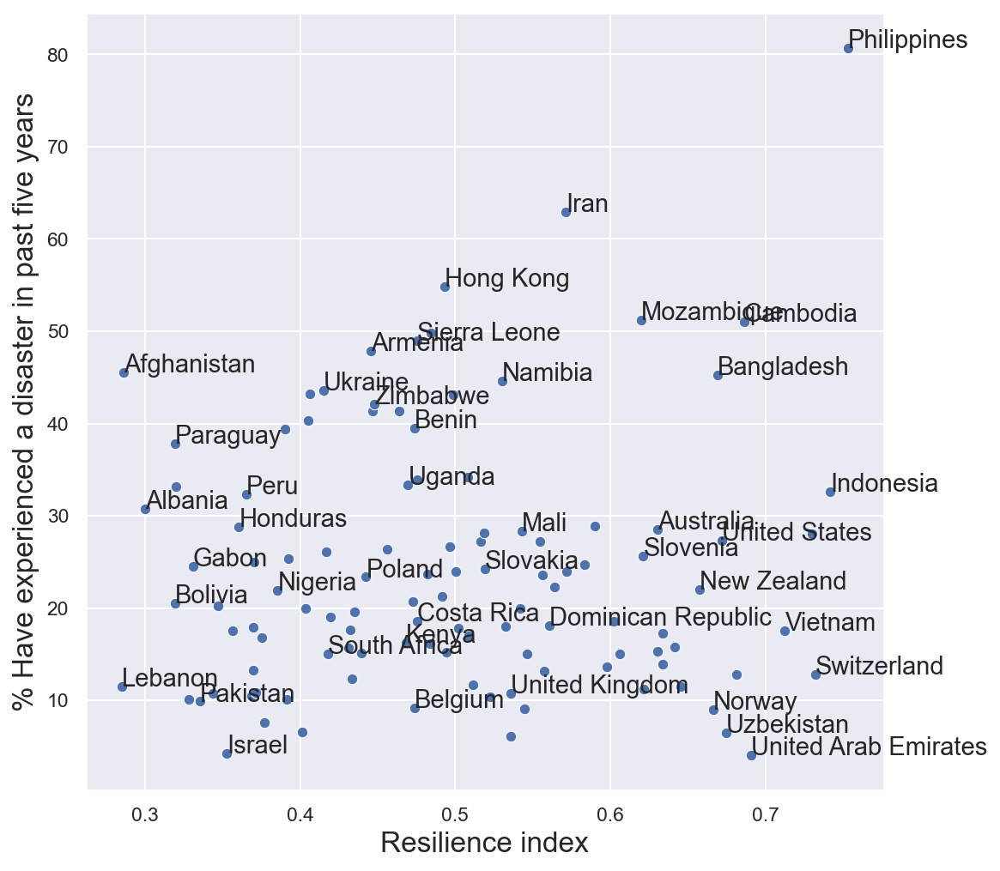

In [115]:

# List of countries to label
countries_to_label = ['United Kingdom','Afghanistan','Bangladesh','Dominican Republic','Honduras','Philippines','Kenya','Mali','Namibia','Pakistan','Philippines','South Africa','New Zealand','Australia','United States','Ukraine','Costa Rica','Zimbabwe','Namibia','Indonesia','Hong Kong','Iran','Cambodia','Armenia','Sierra Leone','United Arab Emirates','Mozambique','Switzerland','Vietnam','Belgium','Norway','Israel','Uzbekistan','Lebanon','Albania','Paraguay','Peru','Benin','Uganda','Uzbekistan','Gabon','Bolivia','Nigeria','Poland','Slovakia','Australia','Slovenia','New Zealand']
#countries_to_label =  merged_res.Country.unique()
plt.figure(figsize=(8, 8),dpi=150)

# Create the linear regression plot
sns.scatterplot(
    data=merged_res,
    x='resilience_index', 
    y='Percentage_disaster_ex', 
)

# Add country names as labels to the points
for i, row in merged_res.iterrows():
    if row['Country'] in countries_to_label:
        plt.text(row['resilience_index'], row['Percentage_disaster_ex'], row['Country'], fontsize=14)

# Set x and y axis labels
plt.xlabel('Resilience index', fontsize=16)
plt.ylabel('% Have experienced a disaster in past five years',fontsize=16)

plt.savefig('./Figures/Disaster_experience_vs_resilience.pdf')
# Display the plot
plt.show()


In [116]:
filtered_data = merged_res[(merged_res['resilience_index'] < 0.4) & (merged_res['Death rates from disasters'] <0.05)]
filtered_data

,Country,Year,Death rates from disasters,"Number of people affected by disasters per 100,000",Percentage_disaster_ex,GlobalRegion,resilience_index
1,Albania,2020,0.000000,0.980835,30.730731,Southern Europe,0.300214
17,Chile,2020,0.000000,1.916909,10.140562,Latin America & Caribbean,0.391069
31,Gabon,2020,0.000000,0.000000,24.549098,Central/Western Africa,0.330843
32,Georgia,2020,0.000000,107.514020,10.510511,Central Asia,0.368445
34,Ghana,2020,0.016388,5.510752,16.850552,Central/Western Africa,0.375192
45,Israel,2020,0.026644,0.079932,4.300000,Middle East,0.352546
54,Lebanon,2020,0.000000,0.000000,11.519364,Middle East,0.285080
60,Moldova,2020,0.000000,0.000000,25.025126,Eastern Europe,0.370574
75,Paraguay,2020,0.049723,29.833817,37.837838,Latin America & Caribbean,0.319474
80,Romania,2020,0.006868,2.162988,10.865191,Eastern Europe,0.371488


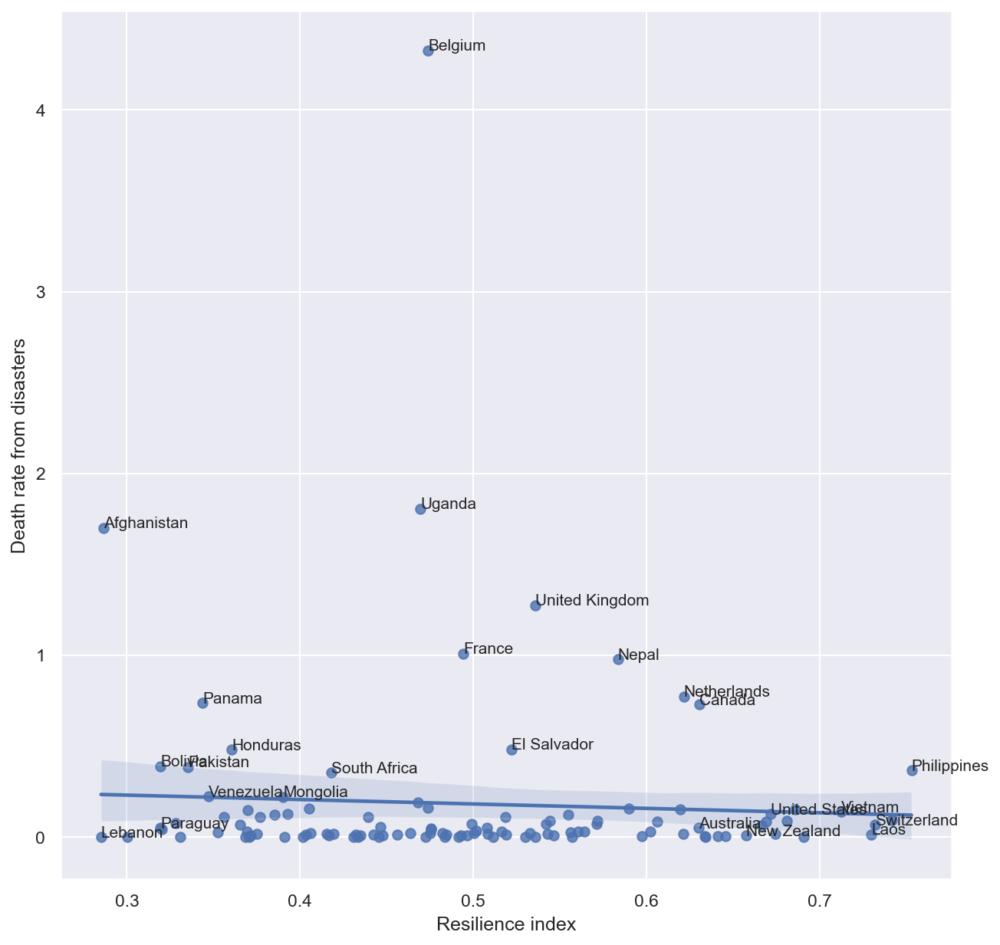

In [117]:
# List of countries to label
countries_to_label = ['United Kingdom','Afghanistan','Belgium','Bolivia','Canada','El Salvador','France','Honduras','Mongolia','Nepal','Netherlands','Pakistan','New Zealand','Australia','United States','Panama','Philippines','South Africa','Uganda','Venezuela','Afghanistan','Vietnam','Switzerland','Laos','Bolivia','Paraguay','Lebanon','']

plt.figure(figsize=(10, 10),dpi=150)

# Create the linear regression plot
sns.regplot(
    data=merged_res,
    x='resilience_index', 
    y='Death rates from disasters', 
)

# Add country names as labels to the points
for i, row in merged_res.iterrows():
    if row['Country'] in countries_to_label:
        plt.text(row['resilience_index'], row['Death rates from disasters'], row['Country'], fontsize=10)

# Set x and y axis labels
plt.xlabel('Resilience index')
plt.ylabel('Death rate from disasters')

plt.savefig('./Figures/Disaster_actual_vs_resilience.pdf')
# Display the plot
plt.show()